# DEFINING THE CONDITIONAL GAN

## Importing Required Libraries

In [ ]:
from numpy import zeros
from numpy import ones
from numpy.random import randint
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras.layers import Input, Conv2D, Conv2DTranspose, LeakyReLU, Activation, Concatenate, Dropout, BatchNormalization
from matplotlib import pyplot as plt
from keras.utils import plot_model

## Defining Discriminator

In [ ]:
def define_discriminator(image_shape):

	# weight initialization
	init = RandomNormal(stddev=0.02) #As described in the original paper

	# source image input
	in_src_image = Input(shape=image_shape)  #Image we want to convert to another image
	# target image input
	in_target_image = Input(shape=image_shape)  #Image we want to generate after training.

	# concatenate images, channel-wise
	merged = Concatenate()([in_src_image, in_target_image])

	# C64: 4x4 kernel Stride 2x2
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	# C128: 4x4 kernel Stride 2x2
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256: 4x4 kernel Stride 2x2
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C512: 4x4 kernel Stride 2x2
	# second last output layer : 4x4 kernel but Stride 1x1
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# patch output
	d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
	patch_out = Activation('sigmoid')(d)
	# define model
	model = Model([in_src_image, in_target_image], patch_out)
	# compile model
    #The model is trained with a batch size of one image and Adam opt.
    #with a small learning rate and 0.5 beta.
    #The loss for the discriminator is weighted by 50% for each model update.
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
	return model

In [ ]:
disc_model = define_discriminator((256,256,3))

## Defining Generator

In [ ]:
def define_encoder_block(layer_in, n_filters, batchnorm=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add downsampling layer
	g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# conditionally add batch normalization
	if batchnorm:
		g = BatchNormalization()(g, training=True)
	# leaky relu activation
	g = LeakyReLU(alpha=0.2)(g)
	return g
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add upsampling layer
	g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# add batch normalization
	g = BatchNormalization()(g, training=True)
	# conditionally add dropout
	if dropout:
		g = Dropout(0.5)(g, training=True)
	# merge with skip connection
	g = Concatenate()([g, skip_in])
	# relu activation
	g = Activation('relu')(g)
	return g

In [ ]:
def define_generator(image_shape=(256,256,3)):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# image input
	in_image = Input(shape=image_shape)
	# encoder model: C64-C128-C256-C512-C512-C512-C512-C512
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	e6 = define_encoder_block(e5, 512)
	e7 = define_encoder_block(e6, 512)
	# bottleneck, no batch norm and relu
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
	b = Activation('relu')(b)
	# decoder model: CD512-CD512-CD512-C512-C256-C128-C64
	d1 = decoder_block(b, e7, 512)
	d2 = decoder_block(d1, e6, 512)
	d3 = decoder_block(d2, e5, 512)
	d4 = decoder_block(d3, e4, 512, dropout=False)
	d5 = decoder_block(d4, e3, 256, dropout=False)
	d6 = decoder_block(d5, e2, 128, dropout=False)
	d7 = decoder_block(d6, e1, 64, dropout=False)
	# output
	g = Conv2DTranspose(image_shape[2], (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7) #Modified
	out_image = Activation('tanh')(g)  #Generates images in the range -1 to 1. So change inputs also to -1 to 1
	# define model
	model = Model(in_image, out_image)
	return model

In [ ]:
gen_model = define_generator((256,256,3))


##Defining GAN Model using Generator and Discriminator Models

In [ ]:
def define_gan(g_model, d_model, image_shape):
	# make weights in the discriminator not trainable
	for layer in d_model.layers:
		if not isinstance(layer, BatchNormalization):
			layer.trainable = False       #Descriminator layers set to untrainable in the combined GAN but
                                                #standalone descriminator will be trainable.

	# define the source image
	in_src = Input(shape=image_shape)
	# suppy the image as input to the generator
	gen_out = g_model(in_src)
	# supply the input image and generated image as inputs to the discriminator
	dis_out = d_model([in_src, gen_out])
	# src image as input, generated image and disc. output as outputs
	model = Model(in_src, [dis_out, gen_out])
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)

    #Total loss is the weighted sum of adversarial loss (BCE) and L1 loss (MAE)
    #Authors suggested weighting BCE vs L1 as 1:100.
	model.compile(loss=['binary_crossentropy', 'mae'],
               optimizer=opt, loss_weights=[1,100])
	return model

##Generate real samples
Picks samples at random from the dataset
##Generate fake samples
Generates samples using the generator model

In [ ]:
def generate_real_samples(dataset, n_samples, patch_shape):
	# unpack dataset
	trainA, trainB = dataset
	# choose random instances
	ix = randint(0, trainA.shape[0], n_samples)
	# retrieve selected images
	X1, X2 = trainA[ix], trainB[ix]
	# generate 'real' class labels (1)
	y = ones((n_samples, patch_shape, patch_shape, 1))
	return [X1, X2], y

# generate a batch of images, returns images and targets
def generate_fake_samples(g_model, samples, patch_shape):
	# generate fake instance
	X = g_model.predict(samples)
	# create 'fake' class labels (0)
	y = zeros((len(X), patch_shape, patch_shape, 1))
	return X, y

## Evaluates the performance of Generator Model by platting generated image against a real image and saves the current generator model

In [ ]:
def summarize_performance(step, g_model, dataset, n_samples=3):
	# select a sample of input images
	[X_realA, X_realB], _ = generate_real_samples(dataset, n_samples, 1)
	# generate a batch of fake samples
	X_fakeB, _ = generate_fake_samples(g_model, X_realA, 1)
	# scale all pixels from [-1,1] to [0,1]
	X_realA = (X_realA + 1) / 2.0
	X_realB = (X_realB + 1) / 2.0
	X_fakeB = (X_fakeB + 1) / 2.0
	# plot real source images
	for i in range(n_samples):
		plt.subplot(3, n_samples, 1 + i)
		plt.axis('off')
		plt.imshow(X_realA[i])
	# plot generated target image
	for i in range(n_samples):
		plt.subplot(3, n_samples, 1 + n_samples + i)
		plt.axis('off')
		plt.imshow(X_fakeB[i])
	# plot real target image
	for i in range(n_samples):
		plt.subplot(3, n_samples, 1 + n_samples*2 + i)
		plt.axis('off')
		plt.imshow(X_realB[i])
	# save plot to file
	filename1 = '/content/drive/MyDrive/Model/plot_%06d.png' % (step+1)
	plt.savefig(filename1)
	plt.close()
	# save the generator model
	filename2 = '/content/drive/MyDrive/Model/model_%06d.h5' % (step+1)
	g_model.save(filename2)
	print('>Saved: %s and %s' % (filename1, filename2))

## Essentially a custom Model.fit method

In [ ]:
from datetime import datetime
from keras.models import load_model

In [ ]:
def save_models(epoch, generator, discriminator, gan):
    generator.save(f'generator_model_epoch_{epoch + 1}.h5')
    discriminator.save(f'discriminator_model_epoch_{epoch + 1}.h5')
    gan.save(f'gan_model_epoch_{epoch + 1}.h5')
    print(f"Models saved for epoch {epoch + 1}")


# this will save models while training so we don't loss them if we wanna stop in middle of training
def train_and_save_models(discriminator, generator, gan, dataset, n_epochs=10, n_batch=1, save_interval=2):
    image_shape = dataset[0].shape[1:]
    n_patch = discriminator.output_shape[1]

    trainA, trainB = dataset
    bat_per_epo = int(len(trainA) / n_batch)
    n_steps = bat_per_epo * n_epochs

    for i in range(n_steps):
        [X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
        X_fakeB, y_fake = generate_fake_samples(generator, X_realA, n_patch)
        d_loss1 = discriminator.train_on_batch([X_realA, X_realB], y_real)
        d_loss2 = discriminator.train_on_batch([X_realA, X_fakeB], y_fake)
        g_loss, _, _ = gan.train_on_batch(X_realA, [y_real, X_realB])
        print(f">{i+1}, d1[{d_loss1:.3f}] d2[{d_loss2:.3f}] g[{g_loss:.3f}]")
        if (i + 1) % (bat_per_epo * save_interval) == 0:
            save_models(i // bat_per_epo, generator, discriminator, gan)



In [ ]:
# def train(d_model, g_model, gan_model, dataset, n_epochs=10, n_batch=28):
# 	n_patch = d_model.output_shape[1]
# 	trainA, trainB = dataset
# 	bat_per_epo = int(len(trainA) / n_batch)
# 	n_steps = bat_per_epo * n_epochs
# 	for i in range(n_steps):
# 		[X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
# 		X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
# 		d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
# 		d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
# 		g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])
# 		print('>%d, d1[%.3f] d2[%.3f] g[%.3f]' % (i+1, d_loss1, d_loss2, g_loss))
# 		if (i+1) % (bat_per_epo * 10) == 0:
# 			summarize_performance(i, g_model, dataset)

# Dataset Preprocessing


## Mounting Drive

In [ ]:
def mount():
  from google.colab import drive
  drive.mount('/content/drive/', force_remount=True)
mount()

Mounted at /content/drive/


## Necessary Imports

In [ ]:
import os
import matplotlib.pyplot as plt
from numpy import asarray
import tensorflow as tf
import cv2
import numpy as np

## Methods for loading and plotting data

In [ ]:
def plot_images(src_images, n_samples):
	for i in range(n_samples):
		plt.subplot(1, n_samples, 1 + i)
		plt.axis('off')
		plt.imshow(src_images[i].astype('uint8'))

def load_images(path):
  source_imgs, target_images = [], []
  for filename in os.listdir(path):
    image =  tf.io.read_file(path+'/'+filename)
    image = tf.io.decode_jpeg(image)
    real_image, sketch_image = image[:, :256, :], image[:, 256:, :]
    source_imgs.append(sketch_image)
    target_images.append(real_image)
    if len(source_imgs) == 15000:
      break
  return [asarray(source_imgs) , asarray(target_images)]

import os
import cv2
import numpy as np

def img2sketch(img_dir, save_dir):
    filenames = os.listdir(img_dir)
    os.makedirs(save_dir, exist_ok=True)
    kernel = np.ones((3, 3), np.uint8)
    count = 1
    limit = 30000  # Set the limit to 3000 images
    for filename in filenames:
        if count > limit:
            break
        img_path = os.path.join(img_dir, filename)
        img = cv2.imread(img_path)
        img = cv2.resize(img, (256, 256))  # Resize original image to 256x256
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        dilated = cv2.dilate(gray, kernel, iterations=1)
        sketch = np.abs(gray.astype(np.float32) - dilated.astype(np.float32))
        sketch = (1 - sketch / 255) * 255
        sketch = sketch.astype(np.uint8)
        sketch_color = cv2.cvtColor(sketch, cv2.COLOR_GRAY2BGR)
        pair_img = np.concatenate((img, sketch_color), axis=1)
        save_path = os.path.join(save_dir, filename)
        cv2.imwrite(save_path, pair_img)
        count += 1


## Loading Data

### Fetching Data from kaggle

In [ ]:
# !mkdir -p /content/drive/MyDrive/AIProject/.kaggle
# !cp /content/drive/MyDrive/AIProject/kaggle.json /content/drive/MyDrive/AIProject/.kaggle/

In [ ]:
# import os
# os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/MyDrive/AIProject/.kaggle'

# !kaggle datasets download -d ipythonx/celebamaskhq

100% 2.93G/2.94G [00:30<00:00, 106MB/s]
100% 2.94G/2.94G [00:30<00:00, 104MB/s]

     






yes
User cancelled operation


In [ ]:
# !unzip -q -d /content/drive/MyDrive/AIProject /content/drive/MyDrive/AIProject/celebamaskhq.zip


replace /content/drive/MyDrive/AIProject/CelebAMask-HQ/CelebA-HQ-img/0.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/drive/MyDrive/AIProject/CelebAMask-HQ/CelebA-HQ-img/1.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/drive/MyDrive/AIProject/CelebAMask-HQ/CelebA-HQ-img/10.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A

A
A


In [ ]:
# import zipfile
# zip_ref = zipfile.ZipFile('/content/destination/folder/celebamaskhq.zip', 'r')
# zip_ref.extractall('/content/drive/MyDrive/AIProject')
# zip_ref.close()

In [ ]:
import os

# Path to the directory
directory_path = '/content/drive/MyDrive/AIProject/CelebAMask-HQ/CelebA-HQ-paired'

# List all files in the directory
image_files = [file for file in os.listdir(directory_path) if file.endswith(('png', 'jpg', 'jpeg', 'gif'))]

# Display the number of image files
num_images = len(image_files)
print(f"Number of image files in the directory: {num_images}")


Number of image files in the directory: 17261


### Preparing dataset for training

In [ ]:
# path = '/content/drive/MyDrive/AIProject/CelebAMask-HQ/CelebA-HQ-img' # path to dataset
# img2sketch(path , '/content/drive/MyDrive/AIProject/CelebAMask-HQ/CelebA-HQ-paired')

In [ ]:
path = '/content/drive/MyDrive/AIProject/CelebAMask-HQ/CelebA-HQ-paired' # path to paired dataset
[source_images, target_images] = load_images(path)

In [ ]:
len(source_images), len(target_images)

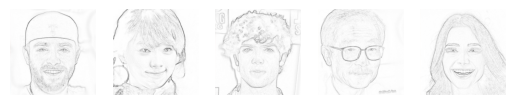

In [ ]:
plot_images(source_images, 5)

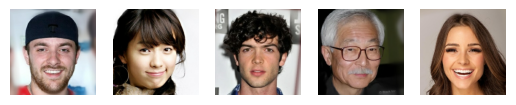

In [ ]:
plot_images(target_images, 5)

## Scaling Data

In [ ]:
# Scaling
data = [source_images, target_images]

def preprocess_data(data):
	X1, X2 = data[0], data[1]
	X1 = (X1 - 127.5) / 127.5
	X2 = (X2 - 127.5) / 127.5
	return [X1, X2]

dataset = preprocess_data(data)

In [ ]:
import numpy as np

# Save preprocessed dataset
np.savez_compressed('/content/drive/MyDrive/AIProject/preprocessed_dataset.npz', X1=dataset[0], X2=dataset[1])

In [ ]:
import numpy as np

# Load preprocessed dataset
loaded_data = np.load('/content/drive/MyDrive/AIProject/preprocessed_dataset.npz')
loaded_X1 = loaded_data['X1']
loaded_X2 = loaded_data['X2']
dataset = [loaded_X1, loaded_X2]

# Training Model

## Necessary Imports

In [ ]:
from keras.models import load_model
from numpy.random import randint
from numpy import vstack
from matplotlib import pyplot
from google.colab.patches import cv2_imshow


## Defining Models

In [ ]:
image_shape = loaded_X1.shape[1:]
d_model = define_discriminator(image_shape)
g_model = define_generator(image_shape)
gan_model = define_gan(g_model, d_model, image_shape)

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


## Training the Model

In [ ]:
from datetime import datetime
start1 = datetime.now()
train_and_save_models(d_model, g_model, gan_model, dataset, n_epochs=25, n_batch=28, save_interval=1)
stop1 = datetime.now()
execution_time = stop1-start1
print("Execution time is: ", execution_time)


1/1 [==============================] - 5s 5s/step
>1, d1[0.247] d2[1.969] g[58.216]
1/1 [==============================] - 0s 42ms/step
>2, d1[2.008] d2[2.431] g[53.455]
1/1 [==============================] - 0s 40ms/step
>3, d1[1.058] d2[1.047] g[49.569]
1/1 [==============================] - 0s 40ms/step
>4, d1[0.536] d2[0.694] g[50.538]
1/1 [==============================] - 0s 41ms/step
>5, d1[0.383] d2[0.662] g[50.435]
1/1 [==============================] - 0s 42ms/step
>6, d1[0.407] d2[0.439] g[47.832]
1/1 [==============================] - 0s 41ms/step
>7, d1[0.482] d2[0.425] g[45.564]
1/1 [==============================] - 0s 33ms/step
>8, d1[0.424] d2[0.449] g[45.525]
1/1 [==============================] - 0s 33ms/step
>9, d1[0.416] d2[0.421] g[49.750]
1/1 [==============================] - 0s 43ms/step
>10, d1[0.444] d2[0.402] g[45.440]
1/1 [==============================] - 0s 41ms/step
>11, d1[0.407] d2[0.387] g[46.567]
1/1 [==============================] - 0s 32ms/step
>1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


>428, d1[0.246] d2[0.343] g[33.702]
Models saved for epoch 1
1/1 [==============================] - 0s 32ms/step
>429, d1[0.218] d2[0.241] g[32.590]
1/1 [==============================] - 0s 33ms/step
>430, d1[0.234] d2[0.451] g[32.192]
1/1 [==============================] - 0s 33ms/step
>431, d1[0.377] d2[0.300] g[29.951]
1/1 [==============================] - 0s 33ms/step
>432, d1[0.284] d2[0.349] g[33.403]
1/1 [==============================] - 0s 33ms/step
>433, d1[0.202] d2[0.311] g[29.274]
1/1 [==============================] - 0s 32ms/step
>434, d1[0.319] d2[0.405] g[29.352]
1/1 [==============================] - 0s 32ms/step
>435, d1[0.210] d2[0.237] g[29.330]
1/1 [==============================] - 0s 31ms/step
>436, d1[0.268] d2[0.312] g[30.156]
1/1 [==============================] - 0s 32ms/step
>437, d1[0.170] d2[0.227] g[27.857]
1/1 [==============================] - 0s 34ms/step
>438, d1[0.317] d2[0.382] g[33.603]
1/1 [==============================] - 0s 32ms/step
>439, d

>856, d1[0.325] d2[0.397] g[27.453]
Models saved for epoch 2
1/1 [==============================] - 0s 34ms/step
>857, d1[0.331] d2[0.338] g[26.292]
1/1 [==============================] - 0s 32ms/step
>858, d1[0.269] d2[0.328] g[31.645]
1/1 [==============================] - 0s 34ms/step
>859, d1[0.322] d2[0.357] g[26.897]
1/1 [==============================] - 0s 34ms/step
>860, d1[0.273] d2[0.275] g[25.344]
1/1 [==============================] - 0s 33ms/step
>861, d1[0.260] d2[0.315] g[26.302]
1/1 [==============================] - 0s 33ms/step
>862, d1[0.250] d2[0.317] g[28.256]
1/1 [==============================] - 0s 46ms/step
>863, d1[0.201] d2[0.296] g[26.300]
1/1 [==============================] - 0s 34ms/step
>864, d1[0.394] d2[0.335] g[23.108]
1/1 [==============================] - 0s 33ms/step
>865, d1[0.326] d2[0.480] g[24.972]
1/1 [==============================] - 0s 33ms/step
>866, d1[0.396] d2[0.381] g[28.591]
1/1 [==============================] - 0s 32ms/step
>867, d

>1284, d1[0.268] d2[0.354] g[26.864]
Models saved for epoch 3
1/1 [==============================] - 0s 35ms/step
>1285, d1[0.302] d2[0.314] g[23.774]
1/1 [==============================] - 0s 34ms/step
>1286, d1[0.268] d2[0.322] g[23.945]
1/1 [==============================] - 0s 35ms/step
>1287, d1[0.249] d2[0.302] g[24.723]
1/1 [==============================] - 0s 35ms/step
>1288, d1[0.309] d2[0.358] g[25.615]
1/1 [==============================] - 0s 34ms/step
>1289, d1[0.316] d2[0.351] g[24.827]
1/1 [==============================] - 0s 34ms/step
>1290, d1[0.331] d2[0.446] g[23.225]
1/1 [==============================] - 0s 31ms/step
>1291, d1[0.228] d2[0.259] g[26.225]
1/1 [==============================] - 0s 33ms/step
>1292, d1[0.331] d2[0.323] g[26.363]
1/1 [==============================] - 0s 36ms/step
>1293, d1[0.379] d2[0.360] g[23.725]
1/1 [==============================] - 0s 35ms/step
>1294, d1[0.335] d2[0.396] g[22.513]
1/1 [==============================] - 0s 45ms/s

>1712, d1[0.476] d2[0.355] g[25.248]
Models saved for epoch 4
1/1 [==============================] - 0s 34ms/step
>1713, d1[0.413] d2[0.370] g[22.673]
1/1 [==============================] - 0s 34ms/step
>1714, d1[0.304] d2[0.364] g[22.556]
1/1 [==============================] - 0s 34ms/step
>1715, d1[0.175] d2[0.290] g[24.101]
1/1 [==============================] - 0s 43ms/step
>1716, d1[0.271] d2[0.217] g[25.745]
1/1 [==============================] - 0s 34ms/step
>1717, d1[0.318] d2[0.396] g[23.356]
1/1 [==============================] - 0s 37ms/step
>1718, d1[0.278] d2[0.316] g[22.754]
1/1 [==============================] - 0s 36ms/step
>1719, d1[0.238] d2[0.380] g[25.573]
1/1 [==============================] - 0s 34ms/step
>1720, d1[0.361] d2[0.294] g[24.738]
1/1 [==============================] - 0s 34ms/step
>1721, d1[0.257] d2[0.318] g[22.148]
1/1 [==============================] - 0s 36ms/step
>1722, d1[0.380] d2[0.329] g[19.867]
1/1 [==============================] - 0s 33ms/s

>2140, d1[0.428] d2[0.275] g[21.427]
Models saved for epoch 5
1/1 [==============================] - 0s 32ms/step
>2141, d1[0.312] d2[0.505] g[20.703]
1/1 [==============================] - 0s 32ms/step
>2142, d1[0.315] d2[0.362] g[20.416]
1/1 [==============================] - 0s 36ms/step
>2143, d1[0.217] d2[0.266] g[20.953]
1/1 [==============================] - 0s 34ms/step
>2144, d1[0.380] d2[0.264] g[21.203]
1/1 [==============================] - 0s 33ms/step
>2145, d1[0.320] d2[0.478] g[20.740]
1/1 [==============================] - 0s 32ms/step
>2146, d1[0.325] d2[0.421] g[19.937]
1/1 [==============================] - 0s 33ms/step
>2147, d1[0.348] d2[0.324] g[21.366]
1/1 [==============================] - 0s 32ms/step
>2148, d1[0.257] d2[0.304] g[21.702]
1/1 [==============================] - 0s 33ms/step
>2149, d1[0.359] d2[0.360] g[21.827]
1/1 [==============================] - 0s 33ms/step
>2150, d1[0.286] d2[0.329] g[21.618]
1/1 [==============================] - 0s 32ms/s

>2568, d1[0.308] d2[0.267] g[20.502]
Models saved for epoch 6
1/1 [==============================] - 0s 33ms/step
>2569, d1[0.201] d2[0.410] g[18.932]
1/1 [==============================] - 0s 34ms/step
>2570, d1[0.224] d2[0.239] g[19.875]
1/1 [==============================] - 0s 33ms/step
>2571, d1[0.260] d2[0.222] g[19.137]
1/1 [==============================] - 0s 33ms/step
>2572, d1[0.249] d2[0.334] g[19.178]
1/1 [==============================] - 0s 35ms/step
>2573, d1[0.210] d2[0.252] g[17.498]
1/1 [==============================] - 0s 33ms/step
>2574, d1[0.251] d2[0.261] g[18.314]
1/1 [==============================] - 0s 33ms/step
>2575, d1[0.160] d2[0.298] g[20.127]
1/1 [==============================] - 0s 33ms/step
>2576, d1[0.423] d2[0.464] g[20.419]
1/1 [==============================] - 0s 32ms/step
>2577, d1[0.283] d2[0.351] g[20.885]
1/1 [==============================] - 0s 32ms/step
>2578, d1[0.255] d2[0.347] g[20.410]
1/1 [==============================] - 0s 32ms/s

>2996, d1[0.141] d2[0.152] g[19.736]
Models saved for epoch 7
1/1 [==============================] - 0s 55ms/step
>2997, d1[0.102] d2[0.180] g[19.031]
1/1 [==============================] - 0s 35ms/step
>2998, d1[0.109] d2[0.245] g[19.918]
1/1 [==============================] - 0s 34ms/step
>2999, d1[0.257] d2[0.196] g[17.727]
1/1 [==============================] - 0s 36ms/step
>3000, d1[0.123] d2[0.178] g[19.648]
1/1 [==============================] - 0s 34ms/step
>3001, d1[0.106] d2[0.172] g[19.748]
1/1 [==============================] - 0s 33ms/step
>3002, d1[0.191] d2[0.309] g[18.251]
1/1 [==============================] - 0s 33ms/step
>3003, d1[0.478] d2[0.305] g[17.573]
1/1 [==============================] - 0s 35ms/step
>3004, d1[0.209] d2[0.579] g[18.211]
1/1 [==============================] - 0s 34ms/step
>3005, d1[0.193] d2[0.153] g[20.228]
1/1 [==============================] - 0s 35ms/step
>3006, d1[0.218] d2[0.150] g[18.594]
1/1 [==============================] - 0s 34ms/s

>3424, d1[0.249] d2[0.227] g[18.859]
Models saved for epoch 8
1/1 [==============================] - 0s 35ms/step
>3425, d1[0.239] d2[0.255] g[17.992]
1/1 [==============================] - 0s 35ms/step
>3426, d1[0.194] d2[0.293] g[17.811]
1/1 [==============================] - 0s 33ms/step
>3427, d1[0.183] d2[0.220] g[18.800]
1/1 [==============================] - 0s 33ms/step
>3428, d1[0.268] d2[0.267] g[17.137]
1/1 [==============================] - 0s 36ms/step
>3429, d1[0.147] d2[0.417] g[21.799]
1/1 [==============================] - 0s 33ms/step
>3430, d1[0.331] d2[0.232] g[18.287]
1/1 [==============================] - 0s 38ms/step
>3431, d1[0.181] d2[0.233] g[17.720]
1/1 [==============================] - 0s 33ms/step
>3432, d1[0.176] d2[0.224] g[19.645]
1/1 [==============================] - 0s 33ms/step
>3433, d1[0.184] d2[0.210] g[17.676]
1/1 [==============================] - 0s 33ms/step
>3434, d1[0.145] d2[0.224] g[21.165]
1/1 [==============================] - 0s 33ms/s

>3852, d1[0.135] d2[0.181] g[17.499]
Models saved for epoch 9
1/1 [==============================] - 0s 35ms/step
>3853, d1[0.155] d2[0.183] g[18.424]
1/1 [==============================] - 0s 34ms/step
>3854, d1[0.144] d2[0.195] g[17.315]
1/1 [==============================] - 0s 35ms/step
>3855, d1[0.168] d2[0.211] g[18.257]
1/1 [==============================] - 0s 37ms/step
>3856, d1[0.121] d2[0.218] g[18.609]
1/1 [==============================] - 0s 34ms/step
>3857, d1[0.249] d2[0.281] g[16.416]
1/1 [==============================] - 0s 34ms/step
>3858, d1[0.182] d2[0.274] g[19.147]
1/1 [==============================] - 0s 34ms/step
>3859, d1[0.151] d2[0.317] g[16.675]
1/1 [==============================] - 0s 36ms/step
>3860, d1[0.374] d2[0.244] g[19.346]
1/1 [==============================] - 0s 38ms/step
>3861, d1[0.217] d2[0.378] g[19.305]
1/1 [==============================] - 0s 37ms/step
>3862, d1[0.370] d2[0.260] g[16.460]
1/1 [==============================] - 0s 34ms/s

>4280, d1[0.259] d2[0.444] g[17.724]
Models saved for epoch 10
1/1 [==============================] - 0s 35ms/step
>4281, d1[0.401] d2[0.349] g[17.209]
1/1 [==============================] - 0s 34ms/step
>4282, d1[0.306] d2[0.337] g[15.586]
1/1 [==============================] - 0s 33ms/step
>4283, d1[0.371] d2[0.568] g[20.079]
1/1 [==============================] - 0s 33ms/step
>4284, d1[0.490] d2[0.394] g[15.812]
1/1 [==============================] - 0s 32ms/step
>4285, d1[0.276] d2[0.392] g[18.894]
1/1 [==============================] - 0s 33ms/step
>4286, d1[0.463] d2[0.293] g[16.683]
1/1 [==============================] - 0s 33ms/step
>4287, d1[0.347] d2[0.460] g[21.090]
1/1 [==============================] - 0s 33ms/step
>4288, d1[0.448] d2[0.372] g[17.432]
1/1 [==============================] - 0s 32ms/step
>4289, d1[0.366] d2[0.406] g[16.621]
1/1 [==============================] - 0s 33ms/step
>4290, d1[0.381] d2[0.333] g[15.559]
1/1 [==============================] - 0s 33ms/

>4708, d1[0.218] d2[0.212] g[17.048]
Models saved for epoch 11
1/1 [==============================] - 0s 35ms/step
>4709, d1[0.274] d2[0.421] g[15.641]
1/1 [==============================] - 0s 33ms/step
>4710, d1[0.432] d2[0.270] g[15.571]
1/1 [==============================] - 0s 33ms/step
>4711, d1[0.346] d2[0.531] g[16.188]
1/1 [==============================] - 0s 34ms/step
>4712, d1[0.281] d2[0.286] g[15.640]
1/1 [==============================] - 0s 34ms/step
>4713, d1[0.155] d2[0.250] g[16.826]
1/1 [==============================] - 0s 36ms/step
>4714, d1[0.298] d2[0.312] g[15.099]
1/1 [==============================] - 0s 33ms/step
>4715, d1[0.221] d2[0.249] g[16.221]
1/1 [==============================] - 0s 33ms/step
>4716, d1[0.146] d2[0.269] g[16.710]
1/1 [==============================] - 0s 33ms/step
>4717, d1[0.420] d2[0.286] g[17.847]
1/1 [==============================] - 0s 33ms/step
>4718, d1[0.139] d2[0.319] g[16.499]
1/1 [==============================] - 0s 33ms/

>5136, d1[0.299] d2[0.301] g[15.439]
Models saved for epoch 12
1/1 [==============================] - 0s 38ms/step
>5137, d1[0.161] d2[0.277] g[17.693]
1/1 [==============================] - 0s 33ms/step
>5138, d1[0.251] d2[0.231] g[16.086]
1/1 [==============================] - 0s 34ms/step
>5139, d1[0.271] d2[0.348] g[16.508]
1/1 [==============================] - 0s 33ms/step
>5140, d1[0.309] d2[0.389] g[16.914]
1/1 [==============================] - 0s 34ms/step
>5141, d1[0.186] d2[0.286] g[15.160]
1/1 [==============================] - 0s 33ms/step
>5142, d1[0.288] d2[0.227] g[14.865]
1/1 [==============================] - 0s 34ms/step
>5143, d1[0.224] d2[0.364] g[13.887]
1/1 [==============================] - 0s 33ms/step
>5144, d1[0.167] d2[0.218] g[15.626]
1/1 [==============================] - 0s 35ms/step
>5145, d1[0.229] d2[0.274] g[16.138]
1/1 [==============================] - 0s 35ms/step
>5146, d1[0.223] d2[0.271] g[16.001]
1/1 [==============================] - 0s 35ms/

>5564, d1[0.348] d2[0.263] g[14.455]
Models saved for epoch 13
1/1 [==============================] - 0s 36ms/step
>5565, d1[0.162] d2[0.473] g[16.082]
1/1 [==============================] - 0s 33ms/step
>5566, d1[0.243] d2[0.375] g[16.401]
1/1 [==============================] - 0s 33ms/step
>5567, d1[0.296] d2[0.253] g[14.470]
1/1 [==============================] - 0s 34ms/step
>5568, d1[0.224] d2[0.311] g[16.456]
1/1 [==============================] - 0s 33ms/step
>5569, d1[0.204] d2[0.297] g[17.019]
1/1 [==============================] - 0s 34ms/step
>5570, d1[0.264] d2[0.236] g[15.231]
1/1 [==============================] - 0s 34ms/step
>5571, d1[0.231] d2[0.433] g[15.493]
1/1 [==============================] - 0s 42ms/step
>5572, d1[0.347] d2[0.293] g[14.460]
1/1 [==============================] - 0s 33ms/step
>5573, d1[0.204] d2[0.276] g[16.471]
1/1 [==============================] - 0s 35ms/step
>5574, d1[0.366] d2[0.326] g[15.669]
1/1 [==============================] - 0s 33ms/

>5992, d1[0.347] d2[0.331] g[14.954]
Models saved for epoch 14
1/1 [==============================] - 0s 37ms/step
>5993, d1[0.201] d2[0.331] g[16.240]
1/1 [==============================] - 0s 33ms/step
>5994, d1[0.334] d2[0.371] g[17.986]
1/1 [==============================] - 0s 36ms/step
>5995, d1[0.233] d2[0.293] g[14.275]
1/1 [==============================] - 0s 33ms/step
>5996, d1[0.325] d2[0.411] g[14.937]
1/1 [==============================] - 0s 35ms/step
>5997, d1[0.219] d2[0.405] g[18.045]
1/1 [==============================] - 0s 33ms/step
>5998, d1[0.475] d2[0.297] g[14.567]
1/1 [==============================] - 0s 34ms/step
>5999, d1[0.450] d2[0.323] g[13.606]
1/1 [==============================] - 0s 34ms/step
>6000, d1[0.365] d2[0.353] g[13.900]
1/1 [==============================] - 0s 33ms/step
>6001, d1[0.250] d2[0.357] g[14.427]
1/1 [==============================] - 0s 33ms/step
>6002, d1[0.215] d2[0.329] g[14.500]
1/1 [==============================] - 0s 33ms/

>6420, d1[0.269] d2[0.340] g[14.062]
Models saved for epoch 15
1/1 [==============================] - 0s 36ms/step
>6421, d1[0.240] d2[0.354] g[13.770]
1/1 [==============================] - 0s 34ms/step
>6422, d1[0.322] d2[0.394] g[16.661]
1/1 [==============================] - 0s 34ms/step
>6423, d1[0.299] d2[0.295] g[15.100]
1/1 [==============================] - 0s 35ms/step
>6424, d1[0.217] d2[0.427] g[14.662]
1/1 [==============================] - 0s 33ms/step
>6425, d1[0.430] d2[0.305] g[14.107]
1/1 [==============================] - 0s 33ms/step
>6426, d1[0.369] d2[0.442] g[14.209]
1/1 [==============================] - 0s 34ms/step
>6427, d1[0.356] d2[0.324] g[13.996]
1/1 [==============================] - 0s 33ms/step
>6428, d1[0.345] d2[0.348] g[16.142]
1/1 [==============================] - 0s 35ms/step
>6429, d1[0.348] d2[0.401] g[12.817]
1/1 [==============================] - 0s 34ms/step
>6430, d1[0.250] d2[0.349] g[15.151]
1/1 [==============================] - 0s 33ms/

>6848, d1[0.256] d2[0.347] g[14.939]
Models saved for epoch 16
1/1 [==============================] - 0s 39ms/step
>6849, d1[0.288] d2[0.371] g[14.748]
1/1 [==============================] - 0s 37ms/step
>6850, d1[0.409] d2[0.308] g[15.095]
1/1 [==============================] - 0s 44ms/step
>6851, d1[0.306] d2[0.419] g[14.047]
1/1 [==============================] - 0s 36ms/step
>6852, d1[0.409] d2[0.308] g[14.356]
1/1 [==============================] - 0s 36ms/step
>6853, d1[0.352] d2[0.363] g[13.274]
1/1 [==============================] - 0s 35ms/step
>6854, d1[0.224] d2[0.336] g[15.634]
1/1 [==============================] - 0s 37ms/step
>6855, d1[0.370] d2[0.304] g[14.411]
1/1 [==============================] - 0s 35ms/step
>6856, d1[0.296] d2[0.359] g[13.187]
1/1 [==============================] - 0s 37ms/step
>6857, d1[0.305] d2[0.365] g[13.865]
1/1 [==============================] - 0s 36ms/step
>6858, d1[0.282] d2[0.356] g[12.399]
1/1 [==============================] - 0s 35ms/

>7276, d1[0.288] d2[0.323] g[13.308]
Models saved for epoch 17
1/1 [==============================] - 0s 35ms/step
>7277, d1[0.369] d2[0.318] g[14.101]
1/1 [==============================] - 0s 37ms/step
>7278, d1[0.329] d2[0.388] g[13.315]
1/1 [==============================] - 0s 34ms/step
>7279, d1[0.353] d2[0.441] g[13.793]
1/1 [==============================] - 0s 33ms/step
>7280, d1[0.300] d2[0.310] g[13.795]
1/1 [==============================] - 0s 34ms/step
>7281, d1[0.381] d2[0.348] g[12.617]
1/1 [==============================] - 0s 33ms/step
>7282, d1[0.307] d2[0.481] g[13.471]
1/1 [==============================] - 0s 37ms/step
>7283, d1[0.293] d2[0.339] g[13.719]
1/1 [==============================] - 0s 35ms/step
>7284, d1[0.395] d2[0.375] g[14.125]
1/1 [==============================] - 0s 32ms/step
>7285, d1[0.319] d2[0.312] g[15.450]
1/1 [==============================] - 0s 35ms/step
>7286, d1[0.313] d2[0.356] g[13.560]
1/1 [==============================] - 0s 33ms/

>7704, d1[0.349] d2[0.322] g[13.084]
Models saved for epoch 18
1/1 [==============================] - 0s 35ms/step
>7705, d1[0.306] d2[0.398] g[13.221]
1/1 [==============================] - 0s 32ms/step
>7706, d1[0.320] d2[0.346] g[13.093]
1/1 [==============================] - 0s 33ms/step
>7707, d1[0.287] d2[0.351] g[12.454]
1/1 [==============================] - 0s 35ms/step
>7708, d1[0.288] d2[0.400] g[12.518]
1/1 [==============================] - 0s 33ms/step
>7709, d1[0.315] d2[0.293] g[13.926]
1/1 [==============================] - 0s 32ms/step
>7710, d1[0.358] d2[0.384] g[11.948]
1/1 [==============================] - 0s 33ms/step
>7711, d1[0.425] d2[0.299] g[13.829]
1/1 [==============================] - 0s 31ms/step
>7712, d1[0.233] d2[0.440] g[11.913]
1/1 [==============================] - 0s 32ms/step
>7713, d1[0.274] d2[0.306] g[13.114]
1/1 [==============================] - 0s 32ms/step
>7714, d1[0.373] d2[0.346] g[14.500]
1/1 [==============================] - 0s 33ms/

>8132, d1[0.381] d2[0.402] g[11.954]
Models saved for epoch 19
1/1 [==============================] - 0s 36ms/step
>8133, d1[0.338] d2[0.341] g[13.081]
1/1 [==============================] - 0s 37ms/step
>8134, d1[0.251] d2[0.350] g[12.438]
1/1 [==============================] - 0s 36ms/step
>8135, d1[0.265] d2[0.287] g[12.835]
1/1 [==============================] - 0s 34ms/step
>8136, d1[0.355] d2[0.295] g[13.029]
1/1 [==============================] - 0s 37ms/step
>8137, d1[0.327] d2[0.464] g[11.868]
1/1 [==============================] - 0s 38ms/step
>8138, d1[0.285] d2[0.332] g[13.139]
1/1 [==============================] - 0s 35ms/step
>8139, d1[0.277] d2[0.360] g[13.235]
1/1 [==============================] - 0s 34ms/step
>8140, d1[0.325] d2[0.308] g[13.130]
1/1 [==============================] - 0s 35ms/step
>8141, d1[0.387] d2[0.331] g[12.621]
1/1 [==============================] - 0s 35ms/step
>8142, d1[0.268] d2[0.380] g[13.032]
1/1 [==============================] - 0s 35ms/

>8560, d1[0.303] d2[0.364] g[12.399]
Models saved for epoch 20
1/1 [==============================] - 0s 33ms/step
>8561, d1[0.296] d2[0.364] g[12.516]
1/1 [==============================] - 0s 34ms/step
>8562, d1[0.297] d2[0.351] g[12.628]
1/1 [==============================] - 0s 35ms/step
>8563, d1[0.222] d2[0.409] g[13.654]
1/1 [==============================] - 0s 34ms/step
>8564, d1[0.391] d2[0.288] g[12.052]
1/1 [==============================] - 0s 34ms/step
>8565, d1[0.261] d2[0.368] g[11.584]
1/1 [==============================] - 0s 32ms/step
>8566, d1[0.281] d2[0.316] g[12.351]
1/1 [==============================] - 0s 33ms/step
>8567, d1[0.325] d2[0.350] g[12.890]
1/1 [==============================] - 0s 34ms/step
>8568, d1[0.443] d2[0.330] g[12.036]
1/1 [==============================] - 0s 33ms/step
>8569, d1[0.290] d2[0.391] g[13.456]
1/1 [==============================] - 0s 33ms/step
>8570, d1[0.317] d2[0.364] g[12.253]
1/1 [==============================] - 0s 32ms/

>8988, d1[0.438] d2[0.312] g[11.708]
Models saved for epoch 21
1/1 [==============================] - 0s 37ms/step
>8989, d1[0.388] d2[0.336] g[12.459]
1/1 [==============================] - 0s 34ms/step
>8990, d1[0.319] d2[0.432] g[11.749]
1/1 [==============================] - 0s 35ms/step
>8991, d1[0.335] d2[0.405] g[12.328]
1/1 [==============================] - 0s 33ms/step
>8992, d1[0.318] d2[0.332] g[12.162]
1/1 [==============================] - 0s 33ms/step
>8993, d1[0.288] d2[0.341] g[11.276]
1/1 [==============================] - 0s 33ms/step
>8994, d1[0.275] d2[0.339] g[11.598]
1/1 [==============================] - 0s 33ms/step
>8995, d1[0.364] d2[0.313] g[11.724]
1/1 [==============================] - 0s 33ms/step
>8996, d1[0.242] d2[0.355] g[11.285]
1/1 [==============================] - 0s 37ms/step
>8997, d1[0.324] d2[0.408] g[12.561]
1/1 [==============================] - 0s 33ms/step
>8998, d1[0.308] d2[0.294] g[13.117]
1/1 [==============================] - 0s 34ms/

>9416, d1[0.322] d2[0.396] g[11.781]
Models saved for epoch 22
1/1 [==============================] - 0s 33ms/step
>9417, d1[0.308] d2[0.394] g[11.674]
1/1 [==============================] - 0s 33ms/step
>9418, d1[0.386] d2[0.336] g[11.848]
1/1 [==============================] - 0s 35ms/step
>9419, d1[0.379] d2[0.335] g[12.247]
1/1 [==============================] - 0s 33ms/step
>9420, d1[0.303] d2[0.415] g[12.031]
1/1 [==============================] - 0s 34ms/step
>9421, d1[0.340] d2[0.364] g[12.292]
1/1 [==============================] - 0s 34ms/step
>9422, d1[0.315] d2[0.406] g[11.213]
1/1 [==============================] - 0s 34ms/step
>9423, d1[0.354] d2[0.363] g[10.304]
1/1 [==============================] - 0s 34ms/step
>9424, d1[0.363] d2[0.348] g[11.734]
1/1 [==============================] - 0s 34ms/step
>9425, d1[0.354] d2[0.327] g[11.860]
1/1 [==============================] - 0s 34ms/step
>9426, d1[0.349] d2[0.328] g[11.662]
1/1 [==============================] - 0s 33ms/

>9844, d1[0.343] d2[0.352] g[10.878]
Models saved for epoch 23
1/1 [==============================] - 0s 34ms/step
>9845, d1[0.373] d2[0.361] g[11.090]
1/1 [==============================] - 0s 34ms/step
>9846, d1[0.359] d2[0.361] g[11.220]
1/1 [==============================] - 0s 33ms/step
>9847, d1[0.342] d2[0.331] g[12.679]
1/1 [==============================] - 0s 33ms/step
>9848, d1[0.353] d2[0.354] g[11.080]
1/1 [==============================] - 0s 35ms/step
>9849, d1[0.284] d2[0.404] g[11.306]
1/1 [==============================] - 0s 33ms/step
>9850, d1[0.300] d2[0.389] g[12.807]
1/1 [==============================] - 0s 35ms/step
>9851, d1[0.383] d2[0.332] g[11.625]
1/1 [==============================] - 0s 37ms/step
>9852, d1[0.334] d2[0.362] g[12.246]
1/1 [==============================] - 0s 34ms/step
>9853, d1[0.363] d2[0.340] g[11.762]
1/1 [==============================] - 0s 42ms/step
>9854, d1[0.364] d2[0.356] g[11.203]
1/1 [==============================] - 0s 33ms/

>10272, d1[0.360] d2[0.351] g[10.980]
Models saved for epoch 24
1/1 [==============================] - 0s 35ms/step
>10273, d1[0.319] d2[0.393] g[10.928]
1/1 [==============================] - 0s 36ms/step
>10274, d1[0.346] d2[0.348] g[11.224]
1/1 [==============================] - 0s 38ms/step
>10275, d1[0.308] d2[0.395] g[11.356]
1/1 [==============================] - 0s 37ms/step
>10276, d1[0.350] d2[0.343] g[12.265]
1/1 [==============================] - 0s 37ms/step
>10277, d1[0.361] d2[0.367] g[10.706]
1/1 [==============================] - 0s 36ms/step
>10278, d1[0.351] d2[0.378] g[10.591]
1/1 [==============================] - 0s 35ms/step
>10279, d1[0.351] d2[0.360] g[10.382]
1/1 [==============================] - 0s 35ms/step
>10280, d1[0.339] d2[0.389] g[10.479]
1/1 [==============================] - 0s 36ms/step
>10281, d1[0.402] d2[0.346] g[12.703]
1/1 [==============================] - 0s 36ms/step
>10282, d1[0.303] d2[0.361] g[11.822]
1/1 [==============================]

>10700, d1[0.382] d2[0.340] g[10.539]
Models saved for epoch 25
Execution time is:  2:02:10.453470


# SECOND TIME TRAIN(FINETUNE)

In [ ]:
# After training the models...
d_model.save('/content/drive/MyDrive/AIProject/25_discriminator_model.h5')
g_model.save('/content/drive/MyDrive/AIProject/25_generator_model.h5')
gan_model.save('/content/drive/MyDrive/AIProject/25_gan_model.h5')

In [ ]:
from tensorflow.keras.models import load_model
from datetime import datetime

# Load the previously trained models
d_model_25 = load_model('/content/drive/MyDrive/AIProject/discriminator_model_epoch_25.h5')  # Replace with your model paths
g_model_25 = load_model('/content/drive/MyDrive/AIProject/generator_model_epoch_25.h5')
gan_model_25 = load_model('/content/drive/MyDrive/AIProject/gan_model_epoch_25.h5')

# Assuming 'dataset' contains the training data
# Continue training the models
start1 = datetime.now()
train_and_save_models(d_model_25, g_model_25, gan_model_25, dataset, n_epochs=25, n_batch=28, save_interval=1)
stop1 = datetime.now()
execution_time = stop1 - start1
print("Execution time is: ", execution_time)

1/1 [==============================] - 1s 595ms/step
>1, d1[0.338] d2[0.390] g[10.511]
1/1 [==============================] - 0s 33ms/step
>2, d1[0.261] d2[0.383] g[11.152]
1/1 [==============================] - 0s 39ms/step
>3, d1[0.303] d2[0.338] g[10.563]
1/1 [==============================] - 0s 32ms/step
>4, d1[0.295] d2[0.310] g[11.577]
1/1 [==============================] - 0s 40ms/step
>5, d1[0.305] d2[0.331] g[10.505]
1/1 [==============================] - 0s 33ms/step
>6, d1[0.289] d2[0.321] g[10.543]
1/1 [==============================] - 0s 42ms/step
>7, d1[0.299] d2[0.324] g[11.063]
1/1 [==============================] - 0s 32ms/step
>8, d1[0.293] d2[0.321] g[11.310]
1/1 [==============================] - 0s 32ms/step
>9, d1[0.287] d2[0.298] g[11.179]
1/1 [==============================] - 0s 36ms/step
>10, d1[0.322] d2[0.281] g[11.152]
1/1 [==============================] - 0s 33ms/step
>11, d1[0.302] d2[0.293] g[11.441]
1/1 [==============================] - 0s 32ms/step

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


>428, d1[0.243] d2[0.248] g[10.018]
Models saved for epoch 1
1/1 [==============================] - 0s 33ms/step
>429, d1[0.240] d2[0.291] g[10.427]
1/1 [==============================] - 0s 32ms/step
>430, d1[0.206] d2[0.241] g[11.761]
1/1 [==============================] - 0s 33ms/step
>431, d1[0.233] d2[0.264] g[9.342]
1/1 [==============================] - 0s 32ms/step
>432, d1[0.173] d2[0.341] g[9.632]
1/1 [==============================] - 0s 33ms/step
>433, d1[0.240] d2[0.212] g[9.940]
1/1 [==============================] - 0s 33ms/step
>434, d1[0.204] d2[0.242] g[12.560]
1/1 [==============================] - 0s 32ms/step
>435, d1[0.266] d2[0.221] g[9.039]
1/1 [==============================] - 0s 33ms/step
>436, d1[0.231] d2[0.255] g[10.199]
1/1 [==============================] - 0s 32ms/step
>437, d1[0.185] d2[0.278] g[10.079]
1/1 [==============================] - 0s 34ms/step
>438, d1[0.226] d2[0.230] g[9.707]
1/1 [==============================] - 0s 33ms/step
>439, d1[0.1

>856, d1[0.230] d2[0.237] g[9.214]
Models saved for epoch 2
1/1 [==============================] - 0s 46ms/step
>857, d1[0.256] d2[0.203] g[9.340]
1/1 [==============================] - 0s 33ms/step
>858, d1[0.157] d2[0.349] g[9.484]
1/1 [==============================] - 0s 34ms/step
>859, d1[0.193] d2[0.225] g[10.166]
1/1 [==============================] - 0s 34ms/step
>860, d1[0.307] d2[0.218] g[9.683]
1/1 [==============================] - 0s 33ms/step
>861, d1[0.171] d2[0.260] g[10.154]
1/1 [==============================] - 0s 33ms/step
>862, d1[0.238] d2[0.224] g[9.195]
1/1 [==============================] - 0s 32ms/step
>863, d1[0.361] d2[0.172] g[9.884]
1/1 [==============================] - 0s 35ms/step
>864, d1[0.197] d2[0.269] g[9.995]
1/1 [==============================] - 0s 33ms/step
>865, d1[0.191] d2[0.222] g[9.867]
1/1 [==============================] - 0s 43ms/step
>866, d1[0.306] d2[0.192] g[8.983]
1/1 [==============================] - 0s 33ms/step
>867, d1[0.202] 

>1284, d1[0.243] d2[0.229] g[10.226]
Models saved for epoch 3
1/1 [==============================] - 0s 33ms/step
>1285, d1[0.268] d2[0.215] g[9.606]
1/1 [==============================] - 0s 34ms/step
>1286, d1[0.175] d2[0.273] g[10.387]
1/1 [==============================] - 0s 45ms/step
>1287, d1[0.287] d2[0.152] g[9.446]
1/1 [==============================] - 0s 33ms/step
>1288, d1[0.189] d2[0.234] g[11.005]
1/1 [==============================] - 0s 33ms/step
>1289, d1[0.297] d2[0.165] g[9.527]
1/1 [==============================] - 0s 32ms/step
>1290, d1[0.184] d2[0.292] g[9.157]
1/1 [==============================] - 0s 33ms/step
>1291, d1[0.223] d2[0.180] g[9.134]
1/1 [==============================] - 0s 31ms/step
>1292, d1[0.213] d2[0.210] g[10.452]
1/1 [==============================] - 0s 31ms/step
>1293, d1[0.144] d2[0.375] g[9.445]
1/1 [==============================] - 0s 32ms/step
>1294, d1[0.190] d2[0.264] g[9.448]
1/1 [==============================] - 0s 33ms/step
>12

>1712, d1[0.147] d2[0.245] g[9.571]
Models saved for epoch 4
1/1 [==============================] - 0s 41ms/step
>1713, d1[0.180] d2[0.245] g[10.292]
1/1 [==============================] - 0s 40ms/step
>1714, d1[0.169] d2[0.223] g[9.170]
1/1 [==============================] - 0s 38ms/step
>1715, d1[0.194] d2[0.186] g[9.475]
1/1 [==============================] - 0s 38ms/step
>1716, d1[0.147] d2[0.259] g[9.206]
1/1 [==============================] - 0s 37ms/step
>1717, d1[0.272] d2[0.248] g[8.839]
1/1 [==============================] - 0s 36ms/step
>1718, d1[0.221] d2[0.209] g[8.172]
1/1 [==============================] - 0s 38ms/step
>1719, d1[0.281] d2[0.173] g[9.084]
1/1 [==============================] - 0s 38ms/step
>1720, d1[0.238] d2[0.165] g[9.175]
1/1 [==============================] - 0s 39ms/step
>1721, d1[0.443] d2[0.147] g[9.404]
1/1 [==============================] - 0s 37ms/step
>1722, d1[0.217] d2[0.188] g[8.327]
1/1 [==============================] - 0s 36ms/step
>1723,

>2140, d1[0.244] d2[0.167] g[9.469]
Models saved for epoch 5
1/1 [==============================] - 0s 34ms/step
>2141, d1[0.212] d2[0.164] g[10.280]
1/1 [==============================] - 0s 33ms/step
>2142, d1[0.170] d2[0.168] g[10.073]
1/1 [==============================] - 0s 34ms/step
>2143, d1[0.125] d2[0.305] g[9.752]
1/1 [==============================] - 0s 34ms/step
>2144, d1[0.316] d2[0.114] g[9.666]
1/1 [==============================] - 0s 33ms/step
>2145, d1[0.214] d2[0.147] g[9.072]
1/1 [==============================] - 0s 33ms/step
>2146, d1[0.078] d2[0.653] g[9.896]
1/1 [==============================] - 0s 33ms/step
>2147, d1[0.408] d2[0.127] g[9.406]
1/1 [==============================] - 0s 33ms/step
>2148, d1[0.297] d2[0.143] g[11.274]
1/1 [==============================] - 0s 35ms/step
>2149, d1[0.163] d2[0.158] g[10.352]
1/1 [==============================] - 0s 34ms/step
>2150, d1[0.153] d2[0.313] g[9.297]
1/1 [==============================] - 0s 33ms/step
>21

>2568, d1[0.268] d2[0.145] g[9.433]
Models saved for epoch 6
1/1 [==============================] - 0s 33ms/step
>2569, d1[0.122] d2[0.183] g[9.939]
1/1 [==============================] - 0s 32ms/step
>2570, d1[0.256] d2[0.174] g[9.553]
1/1 [==============================] - 0s 33ms/step
>2571, d1[0.184] d2[0.284] g[8.080]
1/1 [==============================] - 0s 33ms/step
>2572, d1[0.404] d2[0.123] g[9.207]
1/1 [==============================] - 0s 31ms/step
>2573, d1[0.181] d2[0.157] g[9.510]
1/1 [==============================] - 0s 31ms/step
>2574, d1[0.174] d2[0.207] g[8.573]
1/1 [==============================] - 0s 32ms/step
>2575, d1[0.144] d2[0.350] g[8.882]
1/1 [==============================] - 0s 32ms/step
>2576, d1[0.266] d2[0.146] g[8.609]
1/1 [==============================] - 0s 34ms/step
>2577, d1[0.244] d2[0.215] g[9.100]
1/1 [==============================] - 0s 32ms/step
>2578, d1[0.394] d2[0.141] g[9.331]
1/1 [==============================] - 0s 35ms/step
>2579, 

>2996, d1[0.211] d2[0.179] g[8.967]
Models saved for epoch 7
1/1 [==============================] - 0s 35ms/step
>2997, d1[0.206] d2[0.168] g[8.962]
1/1 [==============================] - 0s 32ms/step
>2998, d1[0.359] d2[0.112] g[8.710]
1/1 [==============================] - 0s 34ms/step
>2999, d1[0.258] d2[0.095] g[9.277]
1/1 [==============================] - 0s 34ms/step
>3000, d1[0.191] d2[0.172] g[8.517]
1/1 [==============================] - 0s 34ms/step
>3001, d1[0.133] d2[0.158] g[8.742]
1/1 [==============================] - 0s 38ms/step
>3002, d1[0.167] d2[0.190] g[8.449]
1/1 [==============================] - 0s 33ms/step
>3003, d1[0.128] d2[0.280] g[8.814]
1/1 [==============================] - 0s 35ms/step
>3004, d1[0.279] d2[0.128] g[10.573]
1/1 [==============================] - 0s 35ms/step
>3005, d1[0.188] d2[0.244] g[9.789]
1/1 [==============================] - 0s 34ms/step
>3006, d1[0.150] d2[0.150] g[9.049]
1/1 [==============================] - 0s 36ms/step
>3007,

>3424, d1[0.330] d2[0.117] g[8.543]
Models saved for epoch 8
1/1 [==============================] - 0s 35ms/step
>3425, d1[0.214] d2[0.147] g[9.020]
1/1 [==============================] - 0s 33ms/step
>3426, d1[0.121] d2[0.139] g[10.601]
1/1 [==============================] - 0s 33ms/step
>3427, d1[0.160] d2[0.181] g[8.459]
1/1 [==============================] - 0s 35ms/step
>3428, d1[0.181] d2[0.189] g[8.940]
1/1 [==============================] - 0s 32ms/step
>3429, d1[0.173] d2[0.189] g[9.747]
1/1 [==============================] - 0s 33ms/step
>3430, d1[0.133] d2[0.125] g[9.068]
1/1 [==============================] - 0s 34ms/step
>3431, d1[0.127] d2[0.222] g[9.038]
1/1 [==============================] - 0s 33ms/step
>3432, d1[0.288] d2[0.082] g[9.658]
1/1 [==============================] - 0s 32ms/step
>3433, d1[0.305] d2[0.152] g[8.763]
1/1 [==============================] - 0s 33ms/step
>3434, d1[0.101] d2[0.250] g[8.998]
1/1 [==============================] - 0s 32ms/step
>3435,

>3852, d1[0.452] d2[0.120] g[8.610]
Models saved for epoch 9
1/1 [==============================] - 0s 36ms/step
>3853, d1[0.239] d2[0.135] g[8.795]
1/1 [==============================] - 0s 35ms/step
>3854, d1[0.342] d2[0.118] g[8.911]
1/1 [==============================] - 0s 33ms/step
>3855, d1[0.126] d2[0.172] g[9.896]
1/1 [==============================] - 0s 33ms/step
>3856, d1[0.065] d2[0.441] g[9.749]
1/1 [==============================] - 0s 35ms/step
>3857, d1[0.249] d2[0.124] g[8.124]
1/1 [==============================] - 0s 33ms/step
>3858, d1[0.151] d2[0.178] g[8.331]
1/1 [==============================] - 0s 34ms/step
>3859, d1[0.059] d2[0.526] g[9.841]
1/1 [==============================] - 0s 33ms/step
>3860, d1[0.337] d2[0.126] g[8.359]
1/1 [==============================] - 0s 34ms/step
>3861, d1[0.332] d2[0.115] g[8.630]
1/1 [==============================] - 0s 34ms/step
>3862, d1[0.427] d2[0.107] g[8.319]
1/1 [==============================] - 0s 36ms/step
>3863, 

>4280, d1[0.253] d2[0.101] g[8.105]
Models saved for epoch 10
1/1 [==============================] - 0s 36ms/step
>4281, d1[0.097] d2[0.171] g[9.744]
1/1 [==============================] - 0s 34ms/step
>4282, d1[0.165] d2[0.119] g[8.759]
1/1 [==============================] - 0s 33ms/step
>4283, d1[0.366] d2[0.082] g[8.742]
1/1 [==============================] - 0s 33ms/step
>4284, d1[0.145] d2[0.185] g[8.602]
1/1 [==============================] - 0s 33ms/step
>4285, d1[0.193] d2[0.098] g[8.105]
1/1 [==============================] - 0s 34ms/step
>4286, d1[0.263] d2[0.097] g[8.413]
1/1 [==============================] - 0s 34ms/step
>4287, d1[0.422] d2[0.099] g[8.629]
1/1 [==============================] - 0s 33ms/step
>4288, d1[0.194] d2[0.172] g[8.564]
1/1 [==============================] - 0s 34ms/step
>4289, d1[0.128] d2[0.326] g[8.296]
1/1 [==============================] - 0s 34ms/step
>4290, d1[0.162] d2[0.164] g[8.806]
1/1 [==============================] - 0s 33ms/step
>4291,

>4708, d1[0.138] d2[0.108] g[8.725]
Models saved for epoch 11
1/1 [==============================] - 0s 35ms/step
>4709, d1[0.088] d2[0.169] g[8.324]
1/1 [==============================] - 0s 34ms/step
>4710, d1[0.200] d2[0.131] g[8.035]
1/1 [==============================] - 0s 33ms/step
>4711, d1[0.103] d2[0.273] g[8.988]
1/1 [==============================] - 0s 34ms/step
>4712, d1[0.193] d2[0.171] g[8.621]
1/1 [==============================] - 0s 33ms/step
>4713, d1[0.101] d2[0.211] g[8.665]
1/1 [==============================] - 0s 35ms/step
>4714, d1[0.160] d2[0.091] g[8.884]
1/1 [==============================] - 0s 33ms/step
>4715, d1[0.579] d2[0.080] g[8.505]
1/1 [==============================] - 0s 35ms/step
>4716, d1[0.097] d2[0.302] g[8.656]
1/1 [==============================] - 0s 33ms/step
>4717, d1[0.094] d2[0.255] g[8.959]
1/1 [==============================] - 0s 33ms/step
>4718, d1[0.075] d2[0.526] g[9.560]
1/1 [==============================] - 0s 34ms/step
>4719,

>5136, d1[0.273] d2[0.092] g[8.387]
Models saved for epoch 12
1/1 [==============================] - 0s 38ms/step
>5137, d1[0.374] d2[0.091] g[8.063]
1/1 [==============================] - 0s 37ms/step
>5138, d1[0.162] d2[0.151] g[8.114]
1/1 [==============================] - 0s 39ms/step
>5139, d1[0.083] d2[0.413] g[8.915]
1/1 [==============================] - 0s 37ms/step
>5140, d1[0.203] d2[0.094] g[9.193]
1/1 [==============================] - 0s 36ms/step
>5141, d1[0.191] d2[0.154] g[7.554]
1/1 [==============================] - 0s 36ms/step
>5142, d1[0.124] d2[0.150] g[8.529]
1/1 [==============================] - 0s 50ms/step
>5143, d1[0.176] d2[0.095] g[8.684]
1/1 [==============================] - 0s 36ms/step
>5144, d1[0.182] d2[0.140] g[8.896]
1/1 [==============================] - 0s 36ms/step
>5145, d1[0.153] d2[0.196] g[8.464]
1/1 [==============================] - 0s 36ms/step
>5146, d1[0.112] d2[0.132] g[8.521]
1/1 [==============================] - 0s 39ms/step
>5147,

>5564, d1[0.101] d2[0.124] g[7.903]
Models saved for epoch 13
1/1 [==============================] - 0s 38ms/step
>5565, d1[0.144] d2[0.196] g[7.956]
1/1 [==============================] - 0s 35ms/step
>5566, d1[0.134] d2[0.124] g[8.862]
1/1 [==============================] - 0s 34ms/step
>5567, d1[0.095] d2[0.203] g[7.762]
1/1 [==============================] - 0s 33ms/step
>5568, d1[0.090] d2[0.191] g[8.018]
1/1 [==============================] - 0s 35ms/step
>5569, d1[0.273] d2[0.082] g[8.267]
1/1 [==============================] - 0s 34ms/step
>5570, d1[0.096] d2[0.178] g[9.017]
1/1 [==============================] - 0s 33ms/step
>5571, d1[0.095] d2[0.204] g[8.182]
1/1 [==============================] - 0s 34ms/step
>5572, d1[0.157] d2[0.202] g[8.599]
1/1 [==============================] - 0s 34ms/step
>5573, d1[0.165] d2[0.163] g[8.522]
1/1 [==============================] - 0s 33ms/step
>5574, d1[0.071] d2[0.297] g[8.318]
1/1 [==============================] - 0s 33ms/step
>5575,

>5992, d1[0.054] d2[0.281] g[8.186]
Models saved for epoch 14
1/1 [==============================] - 0s 34ms/step
>5993, d1[0.211] d2[0.088] g[8.012]
1/1 [==============================] - 0s 33ms/step
>5994, d1[0.239] d2[0.101] g[7.811]
1/1 [==============================] - 0s 32ms/step
>5995, d1[0.261] d2[0.100] g[7.876]
1/1 [==============================] - 0s 32ms/step
>5996, d1[0.112] d2[0.308] g[7.782]
1/1 [==============================] - 0s 32ms/step
>5997, d1[0.181] d2[0.155] g[8.102]
1/1 [==============================] - 0s 33ms/step
>5998, d1[0.093] d2[0.110] g[8.175]
1/1 [==============================] - 0s 33ms/step
>5999, d1[0.107] d2[0.194] g[8.042]
1/1 [==============================] - 0s 32ms/step
>6000, d1[0.102] d2[0.131] g[8.199]
1/1 [==============================] - 0s 34ms/step
>6001, d1[0.185] d2[0.146] g[8.095]
1/1 [==============================] - 0s 34ms/step
>6002, d1[0.141] d2[0.324] g[8.192]
1/1 [==============================] - 0s 34ms/step
>6003,

>6420, d1[0.137] d2[0.157] g[8.165]
Models saved for epoch 15
1/1 [==============================] - 0s 36ms/step
>6421, d1[0.045] d2[0.424] g[7.989]
1/1 [==============================] - 0s 35ms/step
>6422, d1[0.058] d2[0.313] g[8.529]
1/1 [==============================] - 0s 35ms/step
>6423, d1[0.243] d2[0.096] g[7.426]
1/1 [==============================] - 0s 35ms/step
>6424, d1[0.081] d2[0.162] g[8.282]
1/1 [==============================] - 0s 35ms/step
>6425, d1[0.241] d2[0.079] g[8.495]
1/1 [==============================] - 0s 35ms/step
>6426, d1[0.144] d2[0.101] g[7.545]
1/1 [==============================] - 0s 36ms/step
>6427, d1[0.160] d2[0.131] g[8.015]
1/1 [==============================] - 0s 44ms/step
>6428, d1[0.374] d2[0.064] g[7.690]
1/1 [==============================] - 0s 35ms/step
>6429, d1[0.125] d2[0.106] g[7.838]
1/1 [==============================] - 0s 36ms/step
>6430, d1[0.292] d2[0.072] g[8.753]
1/1 [==============================] - 0s 35ms/step
>6431,

>6848, d1[0.131] d2[0.157] g[9.168]
Models saved for epoch 16
1/1 [==============================] - 0s 34ms/step
>6849, d1[0.107] d2[0.167] g[7.752]
1/1 [==============================] - 0s 34ms/step
>6850, d1[0.281] d2[0.078] g[7.860]
1/1 [==============================] - 0s 34ms/step
>6851, d1[0.161] d2[0.135] g[8.417]
1/1 [==============================] - 0s 34ms/step
>6852, d1[0.080] d2[0.220] g[7.786]
1/1 [==============================] - 0s 33ms/step
>6853, d1[0.293] d2[0.159] g[8.332]
1/1 [==============================] - 0s 34ms/step
>6854, d1[0.109] d2[0.188] g[8.345]
1/1 [==============================] - 0s 34ms/step
>6855, d1[0.232] d2[0.121] g[8.110]
1/1 [==============================] - 0s 34ms/step
>6856, d1[0.059] d2[0.444] g[8.100]
1/1 [==============================] - 0s 34ms/step
>6857, d1[0.102] d2[0.155] g[7.658]
1/1 [==============================] - 0s 34ms/step
>6858, d1[0.093] d2[0.141] g[8.539]
1/1 [==============================] - 0s 33ms/step
>6859,

>7276, d1[0.163] d2[0.087] g[7.970]
Models saved for epoch 17
1/1 [==============================] - 0s 35ms/step
>7277, d1[0.043] d2[0.234] g[8.925]
1/1 [==============================] - 0s 33ms/step
>7278, d1[0.263] d2[0.148] g[7.724]
1/1 [==============================] - 0s 33ms/step
>7279, d1[0.269] d2[0.079] g[7.654]
1/1 [==============================] - 0s 34ms/step
>7280, d1[0.089] d2[0.213] g[7.710]
1/1 [==============================] - 0s 33ms/step
>7281, d1[0.176] d2[0.224] g[7.856]
1/1 [==============================] - 0s 34ms/step
>7282, d1[0.072] d2[0.151] g[8.045]
1/1 [==============================] - 0s 34ms/step
>7283, d1[0.089] d2[0.155] g[8.426]
1/1 [==============================] - 0s 33ms/step
>7284, d1[0.183] d2[0.207] g[7.691]
1/1 [==============================] - 0s 33ms/step
>7285, d1[0.085] d2[0.140] g[8.127]
1/1 [==============================] - 0s 33ms/step
>7286, d1[0.151] d2[0.107] g[7.671]
1/1 [==============================] - 0s 33ms/step
>7287,

>7704, d1[0.106] d2[0.159] g[7.707]
Models saved for epoch 18
1/1 [==============================] - 0s 34ms/step
>7705, d1[0.156] d2[0.162] g[7.948]
1/1 [==============================] - 0s 35ms/step
>7706, d1[0.196] d2[0.073] g[7.754]
1/1 [==============================] - 0s 34ms/step
>7707, d1[0.116] d2[0.114] g[7.894]
1/1 [==============================] - 0s 34ms/step
>7708, d1[0.104] d2[0.146] g[7.050]
1/1 [==============================] - 0s 34ms/step
>7709, d1[0.154] d2[0.131] g[7.472]
1/1 [==============================] - 0s 35ms/step
>7710, d1[0.040] d2[0.260] g[8.218]
1/1 [==============================] - 0s 34ms/step
>7711, d1[0.214] d2[0.078] g[7.816]
1/1 [==============================] - 0s 34ms/step
>7712, d1[0.100] d2[0.066] g[8.092]
1/1 [==============================] - 0s 34ms/step
>7713, d1[0.080] d2[0.200] g[7.749]
1/1 [==============================] - 0s 34ms/step
>7714, d1[0.224] d2[0.060] g[7.780]
1/1 [==============================] - 0s 35ms/step
>7715,

>8132, d1[0.323] d2[0.052] g[7.501]
Models saved for epoch 19
1/1 [==============================] - 0s 33ms/step
>8133, d1[0.060] d2[0.245] g[7.520]
1/1 [==============================] - 0s 34ms/step
>8134, d1[0.196] d2[0.132] g[8.123]
1/1 [==============================] - 0s 38ms/step
>8135, d1[0.218] d2[0.111] g[7.384]
1/1 [==============================] - 0s 33ms/step
>8136, d1[0.092] d2[0.184] g[7.423]
1/1 [==============================] - 0s 34ms/step
>8137, d1[0.109] d2[0.140] g[7.812]
1/1 [==============================] - 0s 34ms/step
>8138, d1[0.108] d2[0.167] g[7.727]
1/1 [==============================] - 0s 34ms/step
>8139, d1[0.072] d2[0.216] g[8.002]
1/1 [==============================] - 0s 34ms/step
>8140, d1[0.113] d2[0.154] g[8.323]
1/1 [==============================] - 0s 33ms/step
>8141, d1[0.089] d2[0.158] g[8.648]
1/1 [==============================] - 0s 34ms/step
>8142, d1[0.143] d2[0.079] g[8.014]
1/1 [==============================] - 0s 34ms/step
>8143,

>8560, d1[0.096] d2[0.131] g[7.912]
Models saved for epoch 20
1/1 [==============================] - 0s 39ms/step
>8561, d1[0.264] d2[0.049] g[7.497]
1/1 [==============================] - 0s 37ms/step
>8562, d1[0.149] d2[0.216] g[7.803]
1/1 [==============================] - 0s 36ms/step
>8563, d1[0.059] d2[0.201] g[7.857]
1/1 [==============================] - 0s 37ms/step
>8564, d1[0.136] d2[0.133] g[8.227]
1/1 [==============================] - 0s 37ms/step
>8565, d1[0.117] d2[0.157] g[7.419]
1/1 [==============================] - 0s 37ms/step
>8566, d1[0.162] d2[0.082] g[8.115]
1/1 [==============================] - 0s 36ms/step
>8567, d1[0.114] d2[0.123] g[7.728]
1/1 [==============================] - 0s 37ms/step
>8568, d1[0.128] d2[0.087] g[7.748]
1/1 [==============================] - 0s 39ms/step
>8569, d1[0.122] d2[0.139] g[8.007]
1/1 [==============================] - 0s 37ms/step
>8570, d1[0.064] d2[0.271] g[8.300]
1/1 [==============================] - 0s 36ms/step
>8571,

>8988, d1[0.060] d2[0.255] g[8.274]
Models saved for epoch 21
1/1 [==============================] - 0s 35ms/step
>8989, d1[0.065] d2[0.230] g[8.728]
1/1 [==============================] - 0s 35ms/step
>8990, d1[0.256] d2[0.048] g[7.645]
1/1 [==============================] - 0s 34ms/step
>8991, d1[0.314] d2[0.065] g[7.207]
1/1 [==============================] - 0s 35ms/step
>8992, d1[0.158] d2[0.139] g[7.637]
1/1 [==============================] - 0s 35ms/step
>8993, d1[0.085] d2[0.165] g[8.389]
1/1 [==============================] - 0s 34ms/step
>8994, d1[0.142] d2[0.066] g[7.273]
1/1 [==============================] - 0s 34ms/step
>8995, d1[0.064] d2[0.282] g[7.862]
1/1 [==============================] - 0s 35ms/step
>8996, d1[0.146] d2[0.130] g[7.104]
1/1 [==============================] - 0s 35ms/step
>8997, d1[0.048] d2[0.147] g[7.925]
1/1 [==============================] - 0s 34ms/step
>8998, d1[0.116] d2[0.131] g[7.824]
1/1 [==============================] - 0s 34ms/step
>8999,

>9416, d1[0.157] d2[0.149] g[7.280]
Models saved for epoch 22
1/1 [==============================] - 0s 32ms/step
>9417, d1[0.057] d2[0.137] g[7.780]
1/1 [==============================] - 0s 32ms/step
>9418, d1[0.213] d2[0.056] g[7.813]
1/1 [==============================] - 0s 33ms/step
>9419, d1[0.091] d2[0.130] g[7.202]
1/1 [==============================] - 0s 34ms/step
>9420, d1[0.131] d2[0.082] g[7.339]
1/1 [==============================] - 0s 35ms/step
>9421, d1[0.124] d2[0.102] g[8.042]
1/1 [==============================] - 0s 32ms/step
>9422, d1[0.063] d2[0.173] g[7.794]
1/1 [==============================] - 0s 33ms/step
>9423, d1[0.109] d2[0.058] g[8.079]
1/1 [==============================] - 0s 36ms/step
>9424, d1[0.224] d2[0.099] g[7.582]
1/1 [==============================] - 0s 36ms/step
>9425, d1[0.121] d2[0.074] g[7.710]
1/1 [==============================] - 0s 32ms/step
>9426, d1[0.163] d2[0.130] g[7.423]
1/1 [==============================] - 0s 32ms/step
>9427,

>9844, d1[0.228] d2[0.065] g[7.979]
Models saved for epoch 23
1/1 [==============================] - 0s 37ms/step
>9845, d1[0.129] d2[0.068] g[7.940]
1/1 [==============================] - 0s 35ms/step
>9846, d1[0.166] d2[0.092] g[7.885]
1/1 [==============================] - 0s 35ms/step
>9847, d1[0.036] d2[0.323] g[8.158]
1/1 [==============================] - 0s 35ms/step
>9848, d1[0.083] d2[0.150] g[8.104]
1/1 [==============================] - 0s 34ms/step
>9849, d1[0.393] d2[0.059] g[7.721]
1/1 [==============================] - 0s 35ms/step
>9850, d1[0.053] d2[0.268] g[7.506]
1/1 [==============================] - 0s 35ms/step
>9851, d1[0.084] d2[0.083] g[8.815]
1/1 [==============================] - 0s 42ms/step
>9852, d1[0.110] d2[0.093] g[7.885]
1/1 [==============================] - 0s 35ms/step
>9853, d1[0.046] d2[0.199] g[8.802]
1/1 [==============================] - 0s 37ms/step
>9854, d1[0.226] d2[0.083] g[7.375]
1/1 [==============================] - 0s 35ms/step
>9855,

>10272, d1[0.048] d2[0.204] g[7.626]
Models saved for epoch 24
1/1 [==============================] - 0s 35ms/step
>10273, d1[0.085] d2[0.221] g[7.873]
1/1 [==============================] - 0s 34ms/step
>10274, d1[0.325] d2[0.052] g[7.843]
1/1 [==============================] - 0s 34ms/step
>10275, d1[0.327] d2[0.073] g[8.263]
1/1 [==============================] - 0s 32ms/step
>10276, d1[0.093] d2[0.054] g[8.193]
1/1 [==============================] - 0s 34ms/step
>10277, d1[0.071] d2[0.148] g[7.695]
1/1 [==============================] - 0s 34ms/step
>10278, d1[0.089] d2[0.367] g[7.254]
1/1 [==============================] - 0s 34ms/step
>10279, d1[0.059] d2[0.103] g[7.719]
1/1 [==============================] - 0s 34ms/step
>10280, d1[0.025] d2[0.569] g[7.167]
1/1 [==============================] - 0s 33ms/step
>10281, d1[0.042] d2[0.132] g[7.815]
1/1 [==============================] - 0s 34ms/step
>10282, d1[0.103] d2[0.100] g[8.223]
1/1 [==============================] - 0s 33ms/

>10700, d1[0.117] d2[0.084] g[6.736]
Models saved for epoch 25
Execution time is:  1:51:50.830512


###saving models

In [ ]:
# After training the models...
d_model_25.save('/content/drive/MyDrive/AIProject/50_discriminator_model.h5')
g_model_25.save('/content/drive/MyDrive/AIProject/50_generator_model.h5')
gan_model_25.save('/content/drive/MyDrive/AIProject/50_gan_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from numpy import vstack
from matplotlib import pyplot
from keras.models import load_model
from numpy.random import randint
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import os

In [ ]:
#mounting drive
mount()

Mounted at /content/drive/


# NECESSARY METHODS/HELPERS

In [ ]:
def predict_from_seen(model):
  [X1, X2] = dataset
  ix = randint(0, len(X1), 1)
  src_image, tar_image = X1[ix], X2[ix]

  gen_image = model.predict(src_image)
  plot_images(src_image, gen_image, tar_image)

In [ ]:
def enhance_image(image_path):
    image = cv2.imread(image_path)
    enhanced_image = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)
    resized_image = cv2.resize(enhanced_image, (256, 256))
    cv2_imshow(resized_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


    return resized_image
def plot_images(src_img, gen_img, tar_img):
	images = vstack((src_img, gen_img, tar_img))
	images = (images + 1) / 2.0
	titles = ['Source', 'Generated', 'Expected']
	for i in range(3):
		pyplot.subplot(1, 3, 1 + i)
		pyplot.axis('off')
		pyplot.imshow(images[i])
		pyplot.title(titles[i])
	pyplot.show()


def sketch_plot(img_path):
  img = cv2.imread(img_path)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  dilated = cv2.dilate(gray, np.ones((3, 3), np.uint8), iterations=1)
  sketch = np.abs(gray.astype(np.float32) - dilated.astype(np.float32))
  sketch = (1 - sketch / 255) * 255
  sketch = sketch.astype(np.uint8)
  sketch_color = cv2.cvtColor(sketch, cv2.COLOR_GRAY2BGR)
  resized_image = cv2.resize(sketch_color, (200, 200))
  cv2_imshow(resized_image)
  sketch_color = ( sketch_color - 127.5 ) / 127.5
  sketch_color.shape


def predict_from_unseen(img_path,model):
  img1 = enhance_image(img_path)
  gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
  dilated = cv2.dilate(gray, np.ones((3, 3), np.uint8), iterations=1)
  sketch = np.abs(gray.astype(np.float32) - dilated.astype(np.float32))
  sketch = (1 - sketch / 255) * 255
  sketch = sketch.astype(np.uint8)
  sketch = cv2.cvtColor(sketch, cv2.COLOR_GRAY2BGR)
  sketch.shape
  # Load the image
  # Resize and preprocess the image
  img = cv2.resize(sketch, (256, 256))  # Resize original image to 256x256
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
  img = img.astype(np.float32) / 255.0  # Normalize pixel values to the range [0, 1]
  img = np.expand_dims(img, axis=0)  # Add an extra dimension for batch size

  # Predict using the model
  prediction = model.predict(img)
  plot_images(img, prediction,img)

def display_origional(img_path):
  image = cv2.imread(img_path)
  # Display the image
  resized_image = cv2.resize(image, (200, 200))
  cv2_imshow( resized_image)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

# TRAIN ON 5k MORE IMAGES FROM 12k to 17k same model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from numpy import vstack
from matplotlib import pyplot
import matplotlib.pyplot as plt
from keras.models import load_model
from numpy.random import randint
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import os

In [ ]:
import os
import tensorflow as tf
import numpy as np

def load_images_more(path):
    source_imgs, target_images = [], []
    file_list = sorted(os.listdir(path))  # Get the list of files and sort them
    files_to_load = file_list[12000:17000]  # Select files from index 12000 to 16999

    for filename in files_to_load:
        image = tf.io.read_file(os.path.join(path, filename))
        image = tf.io.decode_jpeg(image)
        real_image, sketch_image = image[:, :256, :], image[:, 256:, :]
        source_imgs.append(sketch_image)
        target_images.append(real_image)

    return [np.asarray(source_imgs), np.asarray(target_images)]
def plot_images_i(src_images, n_samples):
	for i in range(n_samples):
		plt.subplot(1, n_samples, 1 + i)
		plt.axis('off')
		plt.imshow(src_images[i].astype('uint8'))

In [ ]:
path = '/content/drive/MyDrive/AIProject/CelebAMask-HQ/CelebA-HQ-paired' # path to paired dataset
[source_images, target_images] = load_images_more(path)

In [ ]:
len(source_images), len(target_images)

(5000, 5000)

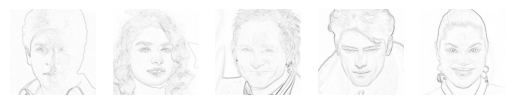

In [ ]:
plot_images_i(source_images, 5)


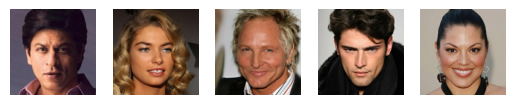

In [ ]:
plot_images_i(target_images, 5)

In [ ]:
# Scaling
data = [source_images, target_images]

def preprocess_data(data):
	X1, X2 = data[0], data[1]
	X1 = (X1 - 127.5) / 127.5
	X2 = (X2 - 127.5) / 127.5
	return [X1, X2]

dataset_more = preprocess_data(data)


In [ ]:
import numpy as np

# Save preprocessed dataset
np.savez_compressed('/content/drive/MyDrive/AIProject/preprocessed_dataset.npz', X1=dataset_more[0], X2=dataset_more[1])


In [ ]:
from tensorflow.keras.models import load_model
from datetime import datetime

# Load the previously trained models
d_model_50 = load_model('/content/drive/MyDrive/AIProject/50_discriminator_model.h5')  # Replace with your model paths
g_model_50 = load_model('/content/drive/MyDrive/AIProject/50_generator_model.h5')
gan_model_50 = load_model('/content/drive/MyDrive/AIProject/50_gan_model.h5')

# Assuming 'dataset' contains the training data
# Continue training the models
start1 = datetime.now()
train_and_save_models(d_model_50, g_model_50, gan_model_50, dataset_more, n_epochs=25, n_batch=28, save_interval=1)
stop1 = datetime.now()
execution_time = stop1 - start1
print("Execution time is: ", execution_time)

1/1 [==============================] - 5s 5s/step
>1, d1[0.087] d2[0.164] g[15.906]
1/1 [==============================] - 0s 41ms/step
>2, d1[0.278] d2[0.106] g[14.838]
1/1 [==============================] - 0s 42ms/step
>3, d1[0.177] d2[0.118] g[18.243]
1/1 [==============================] - 0s 41ms/step
>4, d1[0.144] d2[0.046] g[16.127]
1/1 [==============================] - 0s 41ms/step
>5, d1[0.143] d2[0.098] g[21.354]
1/1 [==============================] - 0s 42ms/step
>6, d1[0.029] d2[0.158] g[18.496]
1/1 [==============================] - 0s 32ms/step
>7, d1[0.134] d2[0.087] g[17.314]
1/1 [==============================] - 0s 42ms/step
>8, d1[0.144] d2[0.110] g[25.501]
1/1 [==============================] - 0s 40ms/step
>9, d1[0.071] d2[0.413] g[20.191]
1/1 [==============================] - 0s 42ms/step
>10, d1[0.478] d2[0.052] g[19.538]
1/1 [==============================] - 0s 32ms/step
>11, d1[0.116] d2[0.070] g[15.733]
1/1 [==============================] - 0s 41ms/step
>1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


>178, d1[0.197] d2[0.256] g[13.578]
Models saved for epoch 1
1/1 [==============================] - 0s 35ms/step
>179, d1[0.365] d2[0.037] g[14.372]
1/1 [==============================] - 0s 32ms/step
>180, d1[0.095] d2[0.066] g[13.466]
1/1 [==============================] - 0s 36ms/step
>181, d1[0.083] d2[0.169] g[16.954]
1/1 [==============================] - 0s 32ms/step
>182, d1[0.202] d2[0.062] g[12.293]
1/1 [==============================] - 0s 35ms/step
>183, d1[0.071] d2[0.161] g[11.444]
1/1 [==============================] - 0s 34ms/step
>184, d1[0.069] d2[0.121] g[14.808]
1/1 [==============================] - 0s 36ms/step
>185, d1[0.318] d2[0.082] g[12.806]
1/1 [==============================] - 0s 32ms/step
>186, d1[0.047] d2[0.116] g[17.580]
1/1 [==============================] - 0s 32ms/step
>187, d1[0.312] d2[0.045] g[13.464]
1/1 [==============================] - 0s 34ms/step
>188, d1[0.175] d2[0.077] g[13.010]
1/1 [==============================] - 0s 33ms/step
>189, d

>356, d1[0.091] d2[0.071] g[11.282]
Models saved for epoch 2
1/1 [==============================] - 0s 33ms/step
>357, d1[0.046] d2[0.112] g[10.746]
1/1 [==============================] - 0s 33ms/step
>358, d1[0.089] d2[0.124] g[12.175]
1/1 [==============================] - 0s 34ms/step
>359, d1[0.175] d2[0.067] g[12.771]
1/1 [==============================] - 0s 32ms/step
>360, d1[0.522] d2[0.054] g[11.864]
1/1 [==============================] - 0s 32ms/step
>361, d1[0.089] d2[0.069] g[10.636]
1/1 [==============================] - 0s 33ms/step
>362, d1[0.048] d2[0.142] g[12.269]
1/1 [==============================] - 0s 32ms/step
>363, d1[0.248] d2[0.079] g[10.419]
1/1 [==============================] - 0s 33ms/step
>364, d1[0.205] d2[0.127] g[12.320]
1/1 [==============================] - 0s 33ms/step
>365, d1[0.106] d2[0.090] g[12.144]
1/1 [==============================] - 0s 32ms/step
>366, d1[0.223] d2[0.060] g[12.367]
1/1 [==============================] - 0s 34ms/step
>367, d

>534, d1[0.046] d2[0.241] g[11.459]
Models saved for epoch 3
1/1 [==============================] - 0s 35ms/step
>535, d1[0.120] d2[0.054] g[11.454]
1/1 [==============================] - 0s 33ms/step
>536, d1[0.397] d2[0.080] g[11.090]
1/1 [==============================] - 0s 32ms/step
>537, d1[0.193] d2[0.067] g[11.309]
1/1 [==============================] - 0s 32ms/step
>538, d1[0.236] d2[0.087] g[11.126]
1/1 [==============================] - 0s 32ms/step
>539, d1[0.136] d2[0.129] g[10.209]
1/1 [==============================] - 0s 35ms/step
>540, d1[0.204] d2[0.088] g[10.237]
1/1 [==============================] - 0s 32ms/step
>541, d1[0.089] d2[0.122] g[10.258]
1/1 [==============================] - 0s 33ms/step
>542, d1[0.036] d2[0.334] g[11.038]
1/1 [==============================] - 0s 34ms/step
>543, d1[0.551] d2[0.068] g[11.725]
1/1 [==============================] - 0s 32ms/step
>544, d1[0.047] d2[0.625] g[11.031]
1/1 [==============================] - 0s 32ms/step
>545, d

>712, d1[0.042] d2[0.234] g[9.353]
Models saved for epoch 4
1/1 [==============================] - 0s 32ms/step
>713, d1[0.364] d2[0.069] g[8.395]
1/1 [==============================] - 0s 32ms/step
>714, d1[0.105] d2[0.193] g[10.756]
1/1 [==============================] - 0s 33ms/step
>715, d1[0.071] d2[0.262] g[9.302]
1/1 [==============================] - 0s 34ms/step
>716, d1[0.070] d2[0.396] g[9.881]
1/1 [==============================] - 0s 33ms/step
>717, d1[0.166] d2[0.117] g[10.369]
1/1 [==============================] - 0s 33ms/step
>718, d1[0.113] d2[0.104] g[10.292]
1/1 [==============================] - 0s 33ms/step
>719, d1[0.128] d2[0.106] g[10.232]
1/1 [==============================] - 0s 37ms/step
>720, d1[0.089] d2[0.050] g[10.047]
1/1 [==============================] - 0s 34ms/step
>721, d1[0.095] d2[0.125] g[9.520]
1/1 [==============================] - 0s 35ms/step
>722, d1[0.135] d2[0.144] g[9.000]
1/1 [==============================] - 0s 34ms/step
>723, d1[0.24

>890, d1[0.094] d2[0.219] g[9.053]
Models saved for epoch 5
1/1 [==============================] - 0s 32ms/step
>891, d1[0.332] d2[0.046] g[9.050]
1/1 [==============================] - 0s 33ms/step
>892, d1[0.098] d2[0.126] g[9.334]
1/1 [==============================] - 0s 33ms/step
>893, d1[0.051] d2[0.125] g[10.185]
1/1 [==============================] - 0s 35ms/step
>894, d1[0.055] d2[0.122] g[9.514]
1/1 [==============================] - 0s 32ms/step
>895, d1[0.159] d2[0.095] g[9.293]
1/1 [==============================] - 0s 32ms/step
>896, d1[0.121] d2[0.075] g[10.371]
1/1 [==============================] - 0s 33ms/step
>897, d1[0.217] d2[0.093] g[9.624]
1/1 [==============================] - 0s 32ms/step
>898, d1[0.134] d2[0.106] g[8.841]
1/1 [==============================] - 0s 32ms/step
>899, d1[0.097] d2[0.114] g[10.566]
1/1 [==============================] - 0s 32ms/step
>900, d1[0.076] d2[0.071] g[9.665]
1/1 [==============================] - 0s 33ms/step
>901, d1[0.254]

>1068, d1[0.247] d2[0.060] g[8.551]
Models saved for epoch 6
1/1 [==============================] - 0s 33ms/step
>1069, d1[0.088] d2[0.200] g[8.986]
1/1 [==============================] - 0s 34ms/step
>1070, d1[0.032] d2[0.200] g[9.243]
1/1 [==============================] - 0s 32ms/step
>1071, d1[0.053] d2[0.173] g[8.812]
1/1 [==============================] - 0s 32ms/step
>1072, d1[0.073] d2[0.162] g[9.067]
1/1 [==============================] - 0s 31ms/step
>1073, d1[0.056] d2[0.287] g[9.493]
1/1 [==============================] - 0s 31ms/step
>1074, d1[0.086] d2[0.073] g[9.555]
1/1 [==============================] - 0s 31ms/step
>1075, d1[0.119] d2[0.089] g[9.323]
1/1 [==============================] - 0s 31ms/step
>1076, d1[0.155] d2[0.145] g[8.857]
1/1 [==============================] - 0s 31ms/step
>1077, d1[0.210] d2[0.105] g[8.483]
1/1 [==============================] - 0s 31ms/step
>1078, d1[0.116] d2[0.122] g[9.506]
1/1 [==============================] - 0s 33ms/step
>1079, 

>1246, d1[0.108] d2[0.084] g[8.506]
Models saved for epoch 7
1/1 [==============================] - 0s 32ms/step
>1247, d1[0.047] d2[0.074] g[9.292]
1/1 [==============================] - 0s 42ms/step
>1248, d1[0.063] d2[0.138] g[9.026]
1/1 [==============================] - 0s 35ms/step
>1249, d1[0.061] d2[0.070] g[10.663]
1/1 [==============================] - 0s 34ms/step
>1250, d1[0.090] d2[0.112] g[8.430]
1/1 [==============================] - 0s 32ms/step
>1251, d1[0.065] d2[0.102] g[9.485]
1/1 [==============================] - 0s 32ms/step
>1252, d1[0.037] d2[0.214] g[8.812]
1/1 [==============================] - 0s 32ms/step
>1253, d1[0.074] d2[0.057] g[9.257]
1/1 [==============================] - 0s 33ms/step
>1254, d1[0.113] d2[0.156] g[8.487]
1/1 [==============================] - 0s 32ms/step
>1255, d1[0.228] d2[0.068] g[7.960]
1/1 [==============================] - 0s 31ms/step
>1256, d1[0.074] d2[0.096] g[9.419]
1/1 [==============================] - 0s 32ms/step
>1257,

>1424, d1[0.118] d2[0.121] g[7.643]
Models saved for epoch 8
1/1 [==============================] - 0s 33ms/step
>1425, d1[0.086] d2[0.199] g[8.159]
1/1 [==============================] - 0s 34ms/step
>1426, d1[0.042] d2[0.281] g[7.699]
1/1 [==============================] - 0s 31ms/step
>1427, d1[0.043] d2[0.183] g[8.256]
1/1 [==============================] - 0s 32ms/step
>1428, d1[0.089] d2[0.075] g[8.027]
1/1 [==============================] - 0s 33ms/step
>1429, d1[0.036] d2[0.060] g[8.071]
1/1 [==============================] - 0s 33ms/step
>1430, d1[0.088] d2[0.101] g[8.655]
1/1 [==============================] - 0s 33ms/step
>1431, d1[0.108] d2[0.108] g[8.777]
1/1 [==============================] - 0s 33ms/step
>1432, d1[0.079] d2[0.068] g[8.616]
1/1 [==============================] - 0s 30ms/step
>1433, d1[0.059] d2[0.115] g[8.600]
1/1 [==============================] - 0s 32ms/step
>1434, d1[0.123] d2[0.062] g[8.104]
1/1 [==============================] - 0s 31ms/step
>1435, 

>1602, d1[0.036] d2[0.226] g[8.828]
Models saved for epoch 9
1/1 [==============================] - 0s 40ms/step
>1603, d1[0.178] d2[0.075] g[8.608]
1/1 [==============================] - 0s 31ms/step
>1604, d1[0.078] d2[0.116] g[9.175]
1/1 [==============================] - 0s 31ms/step
>1605, d1[0.070] d2[0.082] g[8.424]
1/1 [==============================] - 0s 32ms/step
>1606, d1[0.096] d2[0.088] g[8.113]
1/1 [==============================] - 0s 34ms/step
>1607, d1[0.095] d2[0.101] g[9.128]
1/1 [==============================] - 0s 33ms/step
>1608, d1[0.041] d2[0.193] g[8.899]
1/1 [==============================] - 0s 31ms/step
>1609, d1[0.218] d2[0.111] g[7.680]
1/1 [==============================] - 0s 32ms/step
>1610, d1[0.062] d2[0.190] g[8.196]
1/1 [==============================] - 0s 31ms/step
>1611, d1[0.104] d2[0.081] g[7.659]
1/1 [==============================] - 0s 31ms/step
>1612, d1[0.274] d2[0.049] g[9.277]
1/1 [==============================] - 0s 33ms/step
>1613, 

>1780, d1[0.037] d2[0.227] g[8.356]
Models saved for epoch 10
1/1 [==============================] - 0s 44ms/step
>1781, d1[0.220] d2[0.024] g[8.214]
1/1 [==============================] - 0s 34ms/step
>1782, d1[0.059] d2[0.057] g[9.647]
1/1 [==============================] - 0s 35ms/step
>1783, d1[0.048] d2[0.139] g[8.514]
1/1 [==============================] - 0s 34ms/step
>1784, d1[0.090] d2[0.089] g[8.402]
1/1 [==============================] - 0s 33ms/step
>1785, d1[0.396] d2[0.087] g[8.674]
1/1 [==============================] - 0s 35ms/step
>1786, d1[0.142] d2[0.048] g[8.406]
1/1 [==============================] - 0s 45ms/step
>1787, d1[0.038] d2[0.184] g[7.666]
1/1 [==============================] - 0s 34ms/step
>1788, d1[0.071] d2[0.167] g[8.296]
1/1 [==============================] - 0s 33ms/step
>1789, d1[0.073] d2[0.119] g[8.295]
1/1 [==============================] - 0s 35ms/step
>1790, d1[0.119] d2[0.079] g[7.005]
1/1 [==============================] - 0s 32ms/step
>1791,

>1958, d1[0.041] d2[0.139] g[8.488]
Models saved for epoch 11
1/1 [==============================] - 0s 34ms/step
>1959, d1[0.076] d2[0.159] g[8.254]
1/1 [==============================] - 0s 34ms/step
>1960, d1[0.293] d2[0.079] g[7.845]
1/1 [==============================] - 0s 35ms/step
>1961, d1[0.039] d2[0.140] g[7.777]
1/1 [==============================] - 0s 42ms/step
>1962, d1[0.039] d2[0.272] g[7.297]
1/1 [==============================] - 0s 33ms/step
>1963, d1[0.020] d2[0.139] g[8.057]
1/1 [==============================] - 0s 34ms/step
>1964, d1[0.061] d2[0.072] g[7.972]
1/1 [==============================] - 0s 33ms/step
>1965, d1[0.048] d2[0.089] g[7.651]
1/1 [==============================] - 0s 33ms/step
>1966, d1[0.070] d2[0.102] g[8.038]
1/1 [==============================] - 0s 33ms/step
>1967, d1[0.173] d2[0.059] g[7.987]
1/1 [==============================] - 0s 33ms/step
>1968, d1[0.233] d2[0.051] g[7.688]
1/1 [==============================] - 0s 34ms/step
>1969,

>2136, d1[0.032] d2[0.077] g[7.566]
Models saved for epoch 12
1/1 [==============================] - 0s 40ms/step
>2137, d1[0.208] d2[0.065] g[7.377]
1/1 [==============================] - 0s 36ms/step
>2138, d1[0.067] d2[0.123] g[7.903]
1/1 [==============================] - 0s 38ms/step
>2139, d1[0.601] d2[0.044] g[7.551]
1/1 [==============================] - 0s 35ms/step
>2140, d1[0.053] d2[0.104] g[7.552]
1/1 [==============================] - 0s 34ms/step
>2141, d1[0.157] d2[0.157] g[6.999]
1/1 [==============================] - 0s 43ms/step
>2142, d1[0.066] d2[0.226] g[7.280]
1/1 [==============================] - 0s 35ms/step
>2143, d1[0.124] d2[0.133] g[7.171]
1/1 [==============================] - 0s 34ms/step
>2144, d1[0.037] d2[0.250] g[8.371]
1/1 [==============================] - 0s 34ms/step
>2145, d1[0.050] d2[0.454] g[8.148]
1/1 [==============================] - 0s 35ms/step
>2146, d1[0.058] d2[0.069] g[7.423]
1/1 [==============================] - 0s 39ms/step
>2147,

>2314, d1[0.087] d2[0.035] g[7.830]
Models saved for epoch 13
1/1 [==============================] - 0s 34ms/step
>2315, d1[0.135] d2[0.038] g[7.749]
1/1 [==============================] - 0s 33ms/step
>2316, d1[0.229] d2[0.095] g[7.610]
1/1 [==============================] - 0s 34ms/step
>2317, d1[0.082] d2[0.078] g[8.086]
1/1 [==============================] - 0s 35ms/step
>2318, d1[0.214] d2[0.143] g[7.267]
1/1 [==============================] - 0s 32ms/step
>2319, d1[0.157] d2[0.062] g[7.392]
1/1 [==============================] - 0s 35ms/step
>2320, d1[0.058] d2[0.108] g[8.474]
1/1 [==============================] - 0s 37ms/step
>2321, d1[0.044] d2[0.130] g[7.527]
1/1 [==============================] - 0s 35ms/step
>2322, d1[0.077] d2[0.100] g[8.003]
1/1 [==============================] - 0s 34ms/step
>2323, d1[0.098] d2[0.204] g[8.401]
1/1 [==============================] - 0s 34ms/step
>2324, d1[0.097] d2[0.136] g[8.157]
1/1 [==============================] - 0s 37ms/step
>2325,

>2492, d1[0.496] d2[0.033] g[7.285]
Models saved for epoch 14
1/1 [==============================] - 0s 33ms/step
>2493, d1[0.245] d2[0.067] g[7.798]
1/1 [==============================] - 0s 34ms/step
>2494, d1[0.035] d2[0.154] g[8.389]
1/1 [==============================] - 0s 32ms/step
>2495, d1[0.075] d2[0.291] g[8.275]
1/1 [==============================] - 0s 31ms/step
>2496, d1[0.031] d2[0.154] g[8.228]
1/1 [==============================] - 0s 32ms/step
>2497, d1[0.448] d2[0.068] g[7.512]
1/1 [==============================] - 0s 36ms/step
>2498, d1[0.067] d2[0.054] g[7.711]
1/1 [==============================] - 0s 35ms/step
>2499, d1[0.112] d2[0.048] g[7.421]
1/1 [==============================] - 0s 33ms/step
>2500, d1[0.121] d2[0.048] g[7.900]
1/1 [==============================] - 0s 33ms/step
>2501, d1[0.028] d2[0.229] g[8.273]
1/1 [==============================] - 0s 33ms/step
>2502, d1[0.262] d2[0.053] g[7.355]
1/1 [==============================] - 0s 33ms/step
>2503,

>2670, d1[0.098] d2[0.095] g[7.836]
Models saved for epoch 15
1/1 [==============================] - 0s 35ms/step
>2671, d1[0.047] d2[0.461] g[7.482]
1/1 [==============================] - 0s 33ms/step
>2672, d1[0.077] d2[0.080] g[7.284]
1/1 [==============================] - 0s 34ms/step
>2673, d1[0.239] d2[0.055] g[6.877]
1/1 [==============================] - 0s 32ms/step
>2674, d1[0.043] d2[0.079] g[7.375]
1/1 [==============================] - 0s 33ms/step
>2675, d1[0.663] d2[0.075] g[7.324]
1/1 [==============================] - 0s 31ms/step
>2676, d1[0.124] d2[0.100] g[7.660]
1/1 [==============================] - 0s 33ms/step
>2677, d1[0.029] d2[0.126] g[7.995]
1/1 [==============================] - 0s 32ms/step
>2678, d1[0.103] d2[0.053] g[8.366]
1/1 [==============================] - 0s 33ms/step
>2679, d1[0.416] d2[0.038] g[8.024]
1/1 [==============================] - 0s 35ms/step
>2680, d1[0.089] d2[0.096] g[7.098]
1/1 [==============================] - 0s 34ms/step
>2681,

>2848, d1[0.072] d2[0.186] g[7.791]
Models saved for epoch 16
1/1 [==============================] - 0s 33ms/step
>2849, d1[0.156] d2[0.090] g[7.382]
1/1 [==============================] - 0s 35ms/step
>2850, d1[0.062] d2[0.120] g[7.525]
1/1 [==============================] - 0s 34ms/step
>2851, d1[0.034] d2[0.446] g[7.230]
1/1 [==============================] - 0s 34ms/step
>2852, d1[0.037] d2[0.282] g[7.555]
1/1 [==============================] - 0s 32ms/step
>2853, d1[0.118] d2[0.070] g[7.417]
1/1 [==============================] - 0s 41ms/step
>2854, d1[0.274] d2[0.061] g[7.251]
1/1 [==============================] - 0s 31ms/step
>2855, d1[0.078] d2[0.087] g[7.446]
1/1 [==============================] - 0s 31ms/step
>2856, d1[0.140] d2[0.140] g[7.687]
1/1 [==============================] - 0s 30ms/step
>2857, d1[0.073] d2[0.125] g[7.808]
1/1 [==============================] - 0s 32ms/step
>2858, d1[0.139] d2[0.060] g[7.500]
1/1 [==============================] - 0s 33ms/step
>2859,

>3026, d1[0.076] d2[0.092] g[7.066]
Models saved for epoch 17
1/1 [==============================] - 0s 33ms/step
>3027, d1[0.224] d2[0.095] g[7.108]
1/1 [==============================] - 0s 31ms/step
>3028, d1[0.178] d2[0.062] g[7.956]
1/1 [==============================] - 0s 33ms/step
>3029, d1[0.182] d2[0.078] g[6.822]
1/1 [==============================] - 0s 31ms/step
>3030, d1[0.222] d2[0.147] g[7.423]
1/1 [==============================] - 0s 32ms/step
>3031, d1[0.105] d2[0.282] g[7.129]
1/1 [==============================] - 0s 33ms/step
>3032, d1[0.043] d2[0.163] g[7.357]
1/1 [==============================] - 0s 31ms/step
>3033, d1[0.135] d2[0.078] g[6.839]
1/1 [==============================] - 0s 32ms/step
>3034, d1[0.289] d2[0.056] g[7.289]
1/1 [==============================] - 0s 31ms/step
>3035, d1[0.170] d2[0.059] g[7.574]
1/1 [==============================] - 0s 32ms/step
>3036, d1[0.016] d2[0.340] g[7.926]
1/1 [==============================] - 0s 31ms/step
>3037,

>3204, d1[0.104] d2[0.048] g[8.187]
Models saved for epoch 18
1/1 [==============================] - 0s 33ms/step
>3205, d1[0.095] d2[0.044] g[7.481]
1/1 [==============================] - 0s 33ms/step
>3206, d1[0.085] d2[0.242] g[7.104]
1/1 [==============================] - 0s 33ms/step
>3207, d1[0.092] d2[0.069] g[7.492]
1/1 [==============================] - 0s 34ms/step
>3208, d1[0.070] d2[0.131] g[6.930]
1/1 [==============================] - 0s 33ms/step
>3209, d1[0.036] d2[0.268] g[7.278]
1/1 [==============================] - 0s 32ms/step
>3210, d1[0.084] d2[0.049] g[7.007]
1/1 [==============================] - 0s 32ms/step
>3211, d1[0.356] d2[0.059] g[7.205]
1/1 [==============================] - 0s 32ms/step
>3212, d1[0.036] d2[0.102] g[6.837]
1/1 [==============================] - 0s 33ms/step
>3213, d1[0.314] d2[0.070] g[6.578]
1/1 [==============================] - 0s 34ms/step
>3214, d1[0.046] d2[0.114] g[7.293]
1/1 [==============================] - 0s 33ms/step
>3215,

>3382, d1[0.036] d2[0.409] g[7.129]
Models saved for epoch 19
1/1 [==============================] - 0s 32ms/step
>3383, d1[0.119] d2[0.079] g[6.879]
1/1 [==============================] - 0s 33ms/step
>3384, d1[0.035] d2[0.078] g[7.137]
1/1 [==============================] - 0s 33ms/step
>3385, d1[0.212] d2[0.055] g[6.616]
1/1 [==============================] - 0s 40ms/step
>3386, d1[0.109] d2[0.063] g[7.650]
1/1 [==============================] - 0s 32ms/step
>3387, d1[0.184] d2[0.064] g[7.101]
1/1 [==============================] - 0s 32ms/step
>3388, d1[0.057] d2[0.160] g[6.885]
1/1 [==============================] - 0s 33ms/step
>3389, d1[0.040] d2[0.277] g[7.920]
1/1 [==============================] - 0s 33ms/step
>3390, d1[0.160] d2[0.188] g[7.257]
1/1 [==============================] - 0s 32ms/step
>3391, d1[0.081] d2[0.048] g[6.612]
1/1 [==============================] - 0s 32ms/step
>3392, d1[0.292] d2[0.032] g[7.059]
1/1 [==============================] - 0s 31ms/step
>3393,

>3560, d1[0.228] d2[0.148] g[6.980]
Models saved for epoch 20
1/1 [==============================] - 0s 32ms/step
>3561, d1[0.099] d2[0.090] g[7.052]
1/1 [==============================] - 0s 32ms/step
>3562, d1[0.036] d2[0.254] g[7.094]
1/1 [==============================] - 0s 35ms/step
>3563, d1[0.086] d2[0.173] g[6.201]
1/1 [==============================] - 0s 32ms/step
>3564, d1[0.088] d2[0.088] g[7.007]
1/1 [==============================] - 0s 33ms/step
>3565, d1[0.401] d2[0.057] g[6.864]
1/1 [==============================] - 0s 32ms/step
>3566, d1[0.098] d2[0.080] g[7.258]
1/1 [==============================] - 0s 31ms/step
>3567, d1[0.096] d2[0.036] g[6.936]
1/1 [==============================] - 0s 33ms/step
>3568, d1[0.084] d2[0.037] g[6.868]
1/1 [==============================] - 0s 34ms/step
>3569, d1[0.067] d2[0.071] g[6.801]
1/1 [==============================] - 0s 32ms/step
>3570, d1[0.112] d2[0.154] g[6.995]
1/1 [==============================] - 0s 32ms/step
>3571,

>3738, d1[0.550] d2[0.034] g[6.960]
Models saved for epoch 21
1/1 [==============================] - 0s 32ms/step
>3739, d1[0.072] d2[0.049] g[7.015]
1/1 [==============================] - 0s 33ms/step
>3740, d1[0.030] d2[0.127] g[6.675]
1/1 [==============================] - 0s 33ms/step
>3741, d1[0.026] d2[0.147] g[7.944]
1/1 [==============================] - 0s 32ms/step
>3742, d1[0.354] d2[0.027] g[6.632]
1/1 [==============================] - 0s 32ms/step
>3743, d1[0.029] d2[0.540] g[7.647]
1/1 [==============================] - 0s 32ms/step
>3744, d1[0.069] d2[0.125] g[7.105]
1/1 [==============================] - 0s 31ms/step
>3745, d1[0.479] d2[0.044] g[7.540]
1/1 [==============================] - 0s 33ms/step
>3746, d1[0.563] d2[0.036] g[6.668]
1/1 [==============================] - 0s 32ms/step
>3747, d1[0.064] d2[0.182] g[6.750]
1/1 [==============================] - 0s 31ms/step
>3748, d1[0.047] d2[0.087] g[6.840]
1/1 [==============================] - 0s 33ms/step
>3749,

>3916, d1[0.127] d2[0.073] g[6.967]
Models saved for epoch 22
1/1 [==============================] - 0s 34ms/step
>3917, d1[0.181] d2[0.055] g[6.778]
1/1 [==============================] - 0s 32ms/step
>3918, d1[0.294] d2[0.043] g[7.517]
1/1 [==============================] - 0s 32ms/step
>3919, d1[0.046] d2[0.118] g[6.894]
1/1 [==============================] - 0s 33ms/step
>3920, d1[0.065] d2[0.129] g[6.917]
1/1 [==============================] - 0s 31ms/step
>3921, d1[0.104] d2[0.067] g[6.703]
1/1 [==============================] - 0s 32ms/step
>3922, d1[0.116] d2[0.045] g[6.827]
1/1 [==============================] - 0s 33ms/step
>3923, d1[0.053] d2[0.169] g[6.808]
1/1 [==============================] - 0s 33ms/step
>3924, d1[0.263] d2[0.089] g[6.915]
1/1 [==============================] - 0s 32ms/step
>3925, d1[0.035] d2[0.086] g[7.272]
1/1 [==============================] - 0s 33ms/step
>3926, d1[0.049] d2[0.121] g[6.780]
1/1 [==============================] - 0s 32ms/step
>3927,

>4094, d1[0.089] d2[0.078] g[7.054]
Models saved for epoch 23
1/1 [==============================] - 0s 34ms/step
>4095, d1[0.036] d2[0.113] g[6.984]
1/1 [==============================] - 0s 46ms/step
>4096, d1[0.163] d2[0.051] g[6.695]
1/1 [==============================] - 0s 37ms/step
>4097, d1[0.349] d2[0.053] g[6.439]
1/1 [==============================] - 0s 35ms/step
>4098, d1[0.326] d2[0.094] g[7.118]
1/1 [==============================] - 0s 35ms/step
>4099, d1[0.029] d2[0.331] g[6.941]
1/1 [==============================] - 0s 34ms/step
>4100, d1[0.016] d2[0.325] g[7.399]
1/1 [==============================] - 0s 34ms/step
>4101, d1[0.331] d2[0.049] g[6.954]
1/1 [==============================] - 0s 34ms/step
>4102, d1[0.021] d2[0.200] g[6.977]
1/1 [==============================] - 0s 33ms/step
>4103, d1[0.112] d2[0.047] g[6.979]
1/1 [==============================] - 0s 34ms/step
>4104, d1[0.048] d2[0.058] g[7.096]
1/1 [==============================] - 0s 34ms/step
>4105,

>4272, d1[0.180] d2[0.121] g[6.609]
Models saved for epoch 24
1/1 [==============================] - 0s 34ms/step
>4273, d1[0.071] d2[0.154] g[6.375]
1/1 [==============================] - 0s 33ms/step
>4274, d1[0.082] d2[0.056] g[6.903]
1/1 [==============================] - 0s 32ms/step
>4275, d1[0.024] d2[0.436] g[7.258]
1/1 [==============================] - 0s 33ms/step
>4276, d1[0.083] d2[0.066] g[6.818]
1/1 [==============================] - 0s 33ms/step
>4277, d1[0.208] d2[0.081] g[6.628]
1/1 [==============================] - 0s 34ms/step
>4278, d1[0.200] d2[0.033] g[6.498]
1/1 [==============================] - 0s 34ms/step
>4279, d1[0.077] d2[0.162] g[6.437]
1/1 [==============================] - 0s 32ms/step
>4280, d1[0.037] d2[0.293] g[6.138]
1/1 [==============================] - 0s 32ms/step
>4281, d1[0.132] d2[0.041] g[6.988]
1/1 [==============================] - 0s 33ms/step
>4282, d1[0.029] d2[0.108] g[7.815]
1/1 [==============================] - 0s 44ms/step
>4283,

>4450, d1[0.126] d2[0.105] g[7.252]
Models saved for epoch 25
Execution time is:  0:47:43.985515


In [ ]:
# After training the models...
d_model_50.save('/content/drive/MyDrive/AIProject/5k_data_discriminator_model.h5')
g_model_50.save('/content/drive/MyDrive/AIProject/5k_data_generator_model.h5')
gan_model_50.save('/content/drive/MyDrive/AIProject/5k_data_gan_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


#ALSO FINETUNE ON LAST 13K IMAGES

In [ ]:
import os
import cv2
import numpy as np

def img2sketch_moree(img_dir, save_dir):
    filenames = os.listdir(img_dir)
    os.makedirs(save_dir, exist_ok=True)
    kernel = np.ones((3, 3), np.uint8)
    count = 1
    start_index = 17000  # Start index for image processing
    end_index = 30000    # End index for image processing
    for filename in filenames[start_index:end_index]:
        if count > (end_index - start_index):
            break
        img_path = os.path.join(img_dir, filename)
        img = cv2.imread(img_path)
        img = cv2.resize(img, (256, 256))  # Resize original image to 256x256
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        dilated = cv2.dilate(gray, kernel, iterations=1)
        sketch = np.abs(gray.astype(np.float32) - dilated.astype(np.float32))
        sketch = (1 - sketch / 255) * 255
        sketch = sketch.astype(np.uint8)
        sketch_color = cv2.cvtColor(sketch, cv2.COLOR_GRAY2BGR)
        pair_img = np.concatenate((img, sketch_color), axis=1)
        save_path = os.path.join(save_dir, filename)
        cv2.imwrite(save_path, pair_img)
        count += 1


def load_images(path):
  source_imgs, target_images = [], []
  for filename in os.listdir(path):
    image =  tf.io.read_file(path+'/'+filename)
    image = tf.io.decode_jpeg(image)
    real_image, sketch_image = image[:, :256, :], image[:, 256:, :]
    source_imgs.append(sketch_image)
    target_images.append(real_image)
    if len(source_imgs) == 12000:
      break
  return [asarray(source_imgs) , asarray(target_images)]


In [ ]:
# path = '/content/drive/MyDrive/AIProject/CelebAMask-HQ/CelebA-HQ-img' # path to dataset
# img2sketch_moree(path , '/content/drive/MyDrive/AIProject/CelebAMask-HQ/CelebA-HQ-paired_FURTHER')

In [ ]:
path = '/content/drive/MyDrive/AIProject/CelebAMask-HQ/CelebA-HQ-paired_FURTHER' # path to paired dataset
[source_images, target_images] = load_images(path)

In [ ]:
import os

def count_images_in_folder(folder_path):
    image_extensions = ['.jpg', '.jpeg', '.png']  # List of common image extensions
    image_count = 0

    if os.path.exists(folder_path) and os.path.isdir(folder_path):
        for file_name in os.listdir(folder_path):
            file_ext = os.path.splitext(file_name)[1].lower()
            if file_ext in image_extensions:
                image_count += 1

        print(f"Number of image files in '{folder_path}': {image_count}")
    else:
        print("The specified path either doesn't exist or is not a directory.")

# Replace 'path' with your specified folder path
path = '/content/drive/MyDrive/AIProject/CelebAMask-HQ/CelebA-HQ-paired_FURTHER'
count_images_in_folder(path)


Number of image files in '/content/drive/MyDrive/AIProject/CelebAMask-HQ/CelebA-HQ-paired_FURTHER': 13000


In [ ]:
len(source_images), len(target_images)

(13000, 13000)

In [ ]:
# Scaling
data = [source_images, target_images]

def preprocess_data(data):
	X1, X2 = data[0], data[1]
	X1 = (X1 - 127.5) / 127.5
	X2 = (X2 - 127.5) / 127.5
	return [X1, X2]

dataset_Further = preprocess_data(data)


In [ ]:
import numpy as np

# Save preprocessed dataset
np.savez_compressed('/content/drive/MyDrive/AIProject/preprocessed_dataset_last_13k.npz', X1=dataset_Further[0], X2=dataset_Further[1])


In [ ]:
import numpy as np
# Load preprocessed dataset
loaded_data = np.load('/content/drive/MyDrive/AIProject/preprocessed_dataset_last_13k.npz')
loaded_X1 = loaded_data['X1']
loaded_X2 = loaded_data['X2']
dataset_Further = [loaded_X1, loaded_X2]

In [ ]:
from tensorflow.keras.models import load_model
from datetime import datetime

# Load the previously trained models
d_model_5k = load_model('/content/drive/MyDrive/AIProject/5k_data_discriminator_model.h5')  # Replace with your model paths
g_model_5k = load_model('/content/drive/MyDrive/AIProject/5k_data_generator_model.h5')
gan_model_5k = load_model('/content/drive/MyDrive/AIProject/5k_data_gan_model.h5')

# Assuming 'dataset' contains the training data
# Continue training the models
start1 = datetime.now()
train_and_save_models(d_model_5k, g_model_5k, gan_model_5k, dataset_Further, n_epochs=25, n_batch=28, save_interval=1)
stop1 = datetime.now()
execution_time = stop1 - start1
print("Execution time is: ", execution_time)

1/1 [==============================] - 6s 6s/step
>1, d1[0.121] d2[0.024] g[18.755]
1/1 [==============================] - 0s 34ms/step
>2, d1[0.204] d2[0.019] g[21.090]
1/1 [==============================] - 0s 33ms/step
>3, d1[0.308] d2[0.047] g[17.284]
1/1 [==============================] - 0s 35ms/step
>4, d1[0.058] d2[0.081] g[18.693]
1/1 [==============================] - 0s 34ms/step
>5, d1[0.087] d2[0.061] g[19.047]
1/1 [==============================] - 0s 40ms/step
>6, d1[0.422] d2[0.046] g[25.167]
1/1 [==============================] - 0s 32ms/step
>7, d1[0.155] d2[0.028] g[22.796]
1/1 [==============================] - 0s 31ms/step
>8, d1[0.020] d2[0.156] g[27.367]
1/1 [==============================] - 0s 32ms/step
>9, d1[0.063] d2[0.085] g[23.779]
1/1 [==============================] - 0s 31ms/step
>10, d1[0.032] d2[0.081] g[22.387]
1/1 [==============================] - 0s 33ms/step
>11, d1[0.056] d2[0.076] g[20.483]
1/1 [==============================] - 0s 31ms/step
>1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


>464, d1[0.168] d2[0.121] g[15.716]
Models saved for epoch 1
1/1 [==============================] - 0s 44ms/step
>465, d1[0.106] d2[0.072] g[18.362]
1/1 [==============================] - 0s 33ms/step
>466, d1[0.029] d2[0.179] g[15.915]
1/1 [==============================] - 0s 32ms/step
>467, d1[0.070] d2[0.063] g[14.819]
1/1 [==============================] - 0s 33ms/step
>468, d1[0.176] d2[0.047] g[14.035]
1/1 [==============================] - 0s 34ms/step
>469, d1[0.067] d2[0.088] g[14.870]
1/1 [==============================] - 0s 31ms/step
>470, d1[0.039] d2[0.111] g[14.111]
1/1 [==============================] - 0s 31ms/step
>471, d1[0.108] d2[0.038] g[15.919]
1/1 [==============================] - 0s 33ms/step
>472, d1[0.096] d2[0.127] g[15.794]
1/1 [==============================] - 0s 31ms/step
>473, d1[0.034] d2[0.118] g[14.293]
1/1 [==============================] - 0s 32ms/step
>474, d1[0.056] d2[0.105] g[14.916]
1/1 [==============================] - 0s 32ms/step
>475, d

>928, d1[0.112] d2[0.064] g[12.997]
Models saved for epoch 2
1/1 [==============================] - 0s 34ms/step
>929, d1[0.079] d2[0.059] g[15.464]
1/1 [==============================] - 0s 33ms/step
>930, d1[0.123] d2[0.118] g[13.490]
1/1 [==============================] - 0s 32ms/step
>931, d1[0.067] d2[0.096] g[16.049]
1/1 [==============================] - 0s 32ms/step
>932, d1[0.341] d2[0.045] g[13.995]
1/1 [==============================] - 0s 32ms/step
>933, d1[0.132] d2[0.079] g[13.887]
1/1 [==============================] - 0s 31ms/step
>934, d1[0.026] d2[0.129] g[16.854]
1/1 [==============================] - 0s 31ms/step
>935, d1[0.064] d2[0.057] g[13.549]
1/1 [==============================] - 0s 31ms/step
>936, d1[0.029] d2[0.075] g[13.633]
1/1 [==============================] - 0s 31ms/step
>937, d1[0.082] d2[0.069] g[13.489]
1/1 [==============================] - 0s 31ms/step
>938, d1[0.108] d2[0.064] g[13.789]
1/1 [==============================] - 0s 31ms/step
>939, d

>1392, d1[0.065] d2[0.087] g[12.858]
Models saved for epoch 3
1/1 [==============================] - 0s 34ms/step
>1393, d1[0.081] d2[0.072] g[11.937]
1/1 [==============================] - 0s 32ms/step
>1394, d1[0.035] d2[0.097] g[12.830]
1/1 [==============================] - 0s 33ms/step
>1395, d1[0.203] d2[0.053] g[11.658]
1/1 [==============================] - 0s 33ms/step
>1396, d1[0.113] d2[0.115] g[12.171]
1/1 [==============================] - 0s 36ms/step
>1397, d1[0.038] d2[0.154] g[12.314]
1/1 [==============================] - 0s 34ms/step
>1398, d1[0.143] d2[0.056] g[12.990]
1/1 [==============================] - 0s 33ms/step
>1399, d1[0.288] d2[0.036] g[12.498]
1/1 [==============================] - 0s 34ms/step
>1400, d1[0.047] d2[0.063] g[11.892]
1/1 [==============================] - 0s 32ms/step
>1401, d1[0.139] d2[0.100] g[12.241]
1/1 [==============================] - 0s 34ms/step
>1402, d1[0.139] d2[0.075] g[12.028]
1/1 [==============================] - 0s 32ms/s

>1856, d1[0.066] d2[0.069] g[11.825]
Models saved for epoch 4
1/1 [==============================] - 0s 32ms/step
>1857, d1[0.023] d2[0.174] g[12.007]
1/1 [==============================] - 0s 32ms/step
>1858, d1[0.190] d2[0.057] g[10.493]
1/1 [==============================] - 0s 32ms/step
>1859, d1[0.079] d2[0.080] g[11.604]
1/1 [==============================] - 0s 32ms/step
>1860, d1[0.117] d2[0.144] g[11.492]
1/1 [==============================] - 0s 32ms/step
>1861, d1[0.059] d2[0.097] g[11.129]
1/1 [==============================] - 0s 32ms/step
>1862, d1[0.171] d2[0.029] g[11.530]
1/1 [==============================] - 0s 31ms/step
>1863, d1[0.053] d2[0.113] g[11.039]
1/1 [==============================] - 0s 31ms/step
>1864, d1[0.068] d2[0.052] g[13.106]
1/1 [==============================] - 0s 32ms/step
>1865, d1[0.112] d2[0.045] g[13.031]
1/1 [==============================] - 0s 31ms/step
>1866, d1[0.205] d2[0.075] g[11.180]
1/1 [==============================] - 0s 33ms/s

>2320, d1[0.078] d2[0.054] g[10.950]
Models saved for epoch 5
1/1 [==============================] - 0s 35ms/step
>2321, d1[0.026] d2[0.112] g[12.302]
1/1 [==============================] - 0s 34ms/step
>2322, d1[0.071] d2[0.142] g[11.593]
1/1 [==============================] - 0s 33ms/step
>2323, d1[0.144] d2[0.052] g[10.666]
1/1 [==============================] - 0s 37ms/step
>2324, d1[0.243] d2[0.113] g[11.061]
1/1 [==============================] - 0s 31ms/step
>2325, d1[0.126] d2[0.075] g[11.462]
1/1 [==============================] - 0s 33ms/step
>2326, d1[0.055] d2[0.051] g[10.130]
1/1 [==============================] - 0s 32ms/step
>2327, d1[0.064] d2[0.042] g[10.464]
1/1 [==============================] - 0s 33ms/step
>2328, d1[0.158] d2[0.139] g[10.520]
1/1 [==============================] - 0s 32ms/step
>2329, d1[0.235] d2[0.034] g[9.804]
1/1 [==============================] - 0s 32ms/step
>2330, d1[0.012] d2[0.170] g[11.447]
1/1 [==============================] - 0s 33ms/st

>2784, d1[0.275] d2[0.079] g[10.250]
Models saved for epoch 6
1/1 [==============================] - 0s 32ms/step
>2785, d1[0.106] d2[0.142] g[10.218]
1/1 [==============================] - 0s 32ms/step
>2786, d1[0.254] d2[0.040] g[9.938]
1/1 [==============================] - 0s 32ms/step
>2787, d1[0.154] d2[0.044] g[10.176]
1/1 [==============================] - 0s 32ms/step
>2788, d1[0.044] d2[0.057] g[10.641]
1/1 [==============================] - 0s 34ms/step
>2789, d1[0.073] d2[0.170] g[9.635]
1/1 [==============================] - 0s 32ms/step
>2790, d1[0.010] d2[0.171] g[11.506]
1/1 [==============================] - 0s 32ms/step
>2791, d1[0.077] d2[0.045] g[10.379]
1/1 [==============================] - 0s 31ms/step
>2792, d1[0.062] d2[0.096] g[11.289]
1/1 [==============================] - 0s 32ms/step
>2793, d1[0.116] d2[0.080] g[9.917]
1/1 [==============================] - 0s 31ms/step
>2794, d1[0.016] d2[0.208] g[10.952]
1/1 [==============================] - 0s 32ms/step

>3248, d1[0.084] d2[0.057] g[11.283]
Models saved for epoch 7
1/1 [==============================] - 0s 35ms/step
>3249, d1[0.123] d2[0.118] g[9.440]
1/1 [==============================] - 0s 33ms/step
>3250, d1[0.024] d2[0.082] g[10.648]
1/1 [==============================] - 0s 34ms/step
>3251, d1[0.085] d2[0.122] g[10.619]
1/1 [==============================] - 0s 36ms/step
>3252, d1[0.054] d2[0.052] g[10.618]
1/1 [==============================] - 0s 33ms/step
>3253, d1[0.039] d2[0.067] g[9.879]
1/1 [==============================] - 0s 34ms/step
>3254, d1[0.059] d2[0.039] g[11.106]
1/1 [==============================] - 0s 33ms/step
>3255, d1[0.173] d2[0.034] g[9.863]
1/1 [==============================] - 0s 33ms/step
>3256, d1[0.183] d2[0.092] g[10.395]
1/1 [==============================] - 0s 33ms/step
>3257, d1[0.216] d2[0.087] g[9.775]
1/1 [==============================] - 0s 32ms/step
>3258, d1[0.150] d2[0.056] g[10.254]
1/1 [==============================] - 0s 32ms/step


>3712, d1[0.093] d2[0.071] g[11.988]
Models saved for epoch 8
1/1 [==============================] - 0s 33ms/step
>3713, d1[0.288] d2[0.026] g[9.353]
1/1 [==============================] - 0s 32ms/step
>3714, d1[0.848] d2[0.030] g[9.731]
1/1 [==============================] - 0s 32ms/step
>3715, d1[0.021] d2[0.320] g[10.857]
1/1 [==============================] - 0s 33ms/step
>3716, d1[0.028] d2[0.257] g[9.897]
1/1 [==============================] - 0s 32ms/step
>3717, d1[0.097] d2[0.055] g[9.737]
1/1 [==============================] - 0s 31ms/step
>3718, d1[0.114] d2[0.061] g[9.583]
1/1 [==============================] - 0s 32ms/step
>3719, d1[0.031] d2[0.056] g[9.781]
1/1 [==============================] - 0s 31ms/step
>3720, d1[0.031] d2[0.043] g[10.026]
1/1 [==============================] - 0s 31ms/step
>3721, d1[0.102] d2[0.043] g[9.882]
1/1 [==============================] - 0s 32ms/step
>3722, d1[0.098] d2[0.184] g[10.629]
1/1 [==============================] - 0s 32ms/step
>37

>4176, d1[0.036] d2[0.043] g[10.199]
Models saved for epoch 9
1/1 [==============================] - 0s 35ms/step
>4177, d1[0.037] d2[0.039] g[9.257]
1/1 [==============================] - 0s 34ms/step
>4178, d1[0.379] d2[0.021] g[8.740]
1/1 [==============================] - 0s 34ms/step
>4179, d1[0.028] d2[0.054] g[10.139]
1/1 [==============================] - 0s 34ms/step
>4180, d1[0.195] d2[0.028] g[9.351]
1/1 [==============================] - 0s 33ms/step
>4181, d1[0.055] d2[0.115] g[10.742]
1/1 [==============================] - 0s 35ms/step
>4182, d1[0.043] d2[0.285] g[9.107]
1/1 [==============================] - 0s 36ms/step
>4183, d1[0.108] d2[0.043] g[9.506]
1/1 [==============================] - 0s 34ms/step
>4184, d1[0.036] d2[0.058] g[9.793]
1/1 [==============================] - 0s 34ms/step
>4185, d1[0.365] d2[0.029] g[8.884]
1/1 [==============================] - 0s 34ms/step
>4186, d1[0.197] d2[0.035] g[9.522]
1/1 [==============================] - 0s 33ms/step
>418

>4640, d1[0.038] d2[0.054] g[9.925]
Models saved for epoch 10
1/1 [==============================] - 0s 33ms/step
>4641, d1[0.024] d2[0.158] g[8.992]
1/1 [==============================] - 0s 32ms/step
>4642, d1[0.014] d2[0.058] g[9.976]
1/1 [==============================] - 0s 32ms/step
>4643, d1[0.063] d2[0.111] g[9.828]
1/1 [==============================] - 0s 32ms/step
>4644, d1[0.030] d2[0.083] g[9.297]
1/1 [==============================] - 0s 32ms/step
>4645, d1[0.048] d2[0.216] g[9.573]
1/1 [==============================] - 0s 33ms/step
>4646, d1[0.164] d2[0.028] g[10.194]
1/1 [==============================] - 0s 31ms/step
>4647, d1[0.282] d2[0.037] g[10.176]
1/1 [==============================] - 0s 32ms/step
>4648, d1[0.043] d2[0.181] g[9.402]
1/1 [==============================] - 0s 32ms/step
>4649, d1[0.078] d2[0.016] g[10.837]
1/1 [==============================] - 0s 33ms/step
>4650, d1[0.049] d2[0.039] g[9.877]
1/1 [==============================] - 0s 31ms/step
>46

>5104, d1[0.112] d2[0.159] g[8.403]
Models saved for epoch 11
1/1 [==============================] - 0s 36ms/step
>5105, d1[0.159] d2[0.054] g[9.083]
1/1 [==============================] - 0s 35ms/step
>5106, d1[0.047] d2[0.147] g[8.630]
1/1 [==============================] - 0s 35ms/step
>5107, d1[0.062] d2[0.147] g[8.637]
1/1 [==============================] - 0s 36ms/step
>5108, d1[0.060] d2[0.067] g[9.178]
1/1 [==============================] - 0s 35ms/step
>5109, d1[0.255] d2[0.038] g[9.572]
1/1 [==============================] - 0s 35ms/step
>5110, d1[0.067] d2[0.145] g[8.961]
1/1 [==============================] - 0s 35ms/step
>5111, d1[0.023] d2[0.051] g[9.320]
1/1 [==============================] - 0s 35ms/step
>5112, d1[0.070] d2[0.149] g[9.194]
1/1 [==============================] - 0s 35ms/step
>5113, d1[0.094] d2[0.029] g[10.144]
1/1 [==============================] - 0s 35ms/step
>5114, d1[0.040] d2[0.077] g[9.598]
1/1 [==============================] - 0s 35ms/step
>5115

>5568, d1[0.073] d2[0.112] g[8.370]
Models saved for epoch 12
1/1 [==============================] - 0s 33ms/step
>5569, d1[0.066] d2[0.032] g[8.651]
1/1 [==============================] - 0s 32ms/step
>5570, d1[0.025] d2[0.026] g[9.124]
1/1 [==============================] - 0s 32ms/step
>5571, d1[0.038] d2[0.045] g[9.234]
1/1 [==============================] - 0s 32ms/step
>5572, d1[0.102] d2[0.118] g[8.458]
1/1 [==============================] - 0s 33ms/step
>5573, d1[0.281] d2[0.058] g[8.370]
1/1 [==============================] - 0s 32ms/step
>5574, d1[0.125] d2[0.062] g[8.375]
1/1 [==============================] - 0s 32ms/step
>5575, d1[0.087] d2[0.053] g[9.784]
1/1 [==============================] - 0s 32ms/step
>5576, d1[0.022] d2[0.119] g[8.960]
1/1 [==============================] - 0s 32ms/step
>5577, d1[0.020] d2[0.231] g[8.728]
1/1 [==============================] - 0s 32ms/step
>5578, d1[0.021] d2[0.064] g[9.552]
1/1 [==============================] - 0s 31ms/step
>5579,

>6032, d1[0.041] d2[0.102] g[8.708]
Models saved for epoch 13
1/1 [==============================] - 0s 32ms/step
>6033, d1[0.703] d2[0.034] g[8.590]
1/1 [==============================] - 0s 32ms/step
>6034, d1[0.039] d2[0.038] g[9.026]
1/1 [==============================] - 0s 31ms/step
>6035, d1[0.092] d2[0.056] g[8.548]
1/1 [==============================] - 0s 32ms/step
>6036, d1[0.042] d2[0.246] g[9.397]
1/1 [==============================] - 0s 32ms/step
>6037, d1[0.090] d2[0.043] g[8.327]
1/1 [==============================] - 0s 31ms/step
>6038, d1[0.125] d2[0.057] g[8.683]
1/1 [==============================] - 0s 32ms/step
>6039, d1[0.140] d2[0.036] g[8.433]
1/1 [==============================] - 0s 31ms/step
>6040, d1[0.037] d2[0.130] g[8.756]
1/1 [==============================] - 0s 31ms/step
>6041, d1[0.089] d2[0.144] g[9.152]
1/1 [==============================] - 0s 32ms/step
>6042, d1[0.267] d2[0.032] g[8.358]
1/1 [==============================] - 0s 32ms/step
>6043,

>6496, d1[0.018] d2[0.115] g[8.701]
Models saved for epoch 14
1/1 [==============================] - 0s 33ms/step
>6497, d1[0.055] d2[0.056] g[8.988]
1/1 [==============================] - 0s 31ms/step
>6498, d1[0.077] d2[0.096] g[8.521]
1/1 [==============================] - 0s 32ms/step
>6499, d1[0.034] d2[0.057] g[8.736]
1/1 [==============================] - 0s 33ms/step
>6500, d1[0.044] d2[0.085] g[8.400]
1/1 [==============================] - 0s 32ms/step
>6501, d1[0.032] d2[0.089] g[8.642]
1/1 [==============================] - 0s 31ms/step
>6502, d1[0.191] d2[0.021] g[7.647]
1/1 [==============================] - 0s 32ms/step
>6503, d1[0.191] d2[0.060] g[7.754]
1/1 [==============================] - 0s 32ms/step
>6504, d1[0.015] d2[0.101] g[8.452]
1/1 [==============================] - 0s 33ms/step
>6505, d1[0.139] d2[0.093] g[8.332]
1/1 [==============================] - 0s 33ms/step
>6506, d1[0.415] d2[0.036] g[8.846]
1/1 [==============================] - 0s 32ms/step
>6507,

>6960, d1[0.041] d2[0.056] g[9.270]
Models saved for epoch 15
1/1 [==============================] - 0s 33ms/step
>6961, d1[0.057] d2[0.105] g[8.827]
1/1 [==============================] - 0s 34ms/step
>6962, d1[0.048] d2[0.145] g[8.197]
1/1 [==============================] - 0s 32ms/step
>6963, d1[0.128] d2[0.037] g[8.930]
1/1 [==============================] - 0s 32ms/step
>6964, d1[0.051] d2[0.054] g[8.625]
1/1 [==============================] - 0s 31ms/step
>6965, d1[0.098] d2[0.060] g[8.135]
1/1 [==============================] - 0s 32ms/step
>6966, d1[0.401] d2[0.075] g[8.179]
1/1 [==============================] - 0s 31ms/step
>6967, d1[0.022] d2[0.085] g[8.237]
1/1 [==============================] - 0s 32ms/step
>6968, d1[0.063] d2[0.082] g[8.152]
1/1 [==============================] - 0s 30ms/step
>6969, d1[0.043] d2[0.158] g[8.389]
1/1 [==============================] - 0s 33ms/step
>6970, d1[0.019] d2[0.111] g[8.964]
1/1 [==============================] - 0s 31ms/step
>6971,

>7424, d1[0.043] d2[0.055] g[8.929]
Models saved for epoch 16
1/1 [==============================] - 0s 33ms/step
>7425, d1[0.047] d2[0.020] g[8.770]
1/1 [==============================] - 0s 32ms/step
>7426, d1[0.069] d2[0.068] g[8.391]
1/1 [==============================] - 0s 32ms/step
>7427, d1[0.021] d2[0.077] g[9.154]
1/1 [==============================] - 0s 33ms/step
>7428, d1[0.098] d2[0.027] g[7.830]
1/1 [==============================] - 0s 32ms/step
>7429, d1[0.022] d2[0.068] g[8.603]
1/1 [==============================] - 0s 33ms/step
>7430, d1[0.048] d2[0.104] g[8.547]
1/1 [==============================] - 0s 32ms/step
>7431, d1[0.321] d2[0.013] g[9.137]
1/1 [==============================] - 0s 32ms/step
>7432, d1[0.046] d2[0.079] g[8.250]
1/1 [==============================] - 0s 32ms/step
>7433, d1[0.084] d2[0.019] g[8.236]
1/1 [==============================] - 0s 33ms/step
>7434, d1[0.044] d2[0.073] g[7.906]
1/1 [==============================] - 0s 31ms/step
>7435,

>7888, d1[0.039] d2[0.031] g[8.947]
Models saved for epoch 17
1/1 [==============================] - 0s 31ms/step
>7889, d1[0.018] d2[0.158] g[8.148]
1/1 [==============================] - 0s 32ms/step
>7890, d1[0.326] d2[0.052] g[8.126]
1/1 [==============================] - 0s 33ms/step
>7891, d1[0.045] d2[0.103] g[8.125]
1/1 [==============================] - 0s 32ms/step
>7892, d1[0.017] d2[0.151] g[9.242]
1/1 [==============================] - 0s 32ms/step
>7893, d1[0.070] d2[0.120] g[8.422]
1/1 [==============================] - 0s 32ms/step
>7894, d1[0.059] d2[0.034] g[8.628]
1/1 [==============================] - 0s 32ms/step
>7895, d1[0.021] d2[0.034] g[8.486]
1/1 [==============================] - 0s 32ms/step
>7896, d1[0.019] d2[0.035] g[8.269]
1/1 [==============================] - 0s 32ms/step
>7897, d1[0.140] d2[0.032] g[8.831]
1/1 [==============================] - 0s 32ms/step
>7898, d1[0.078] d2[0.051] g[8.368]
1/1 [==============================] - 0s 31ms/step
>7899,

>8352, d1[0.101] d2[0.028] g[7.919]
Models saved for epoch 18
1/1 [==============================] - 0s 37ms/step
>8353, d1[0.053] d2[0.066] g[8.776]
1/1 [==============================] - 0s 34ms/step
>8354, d1[0.132] d2[0.017] g[7.967]
1/1 [==============================] - 0s 35ms/step
>8355, d1[0.109] d2[0.044] g[8.693]
1/1 [==============================] - 0s 33ms/step
>8356, d1[0.040] d2[0.023] g[8.926]
1/1 [==============================] - 0s 34ms/step
>8357, d1[0.100] d2[0.120] g[7.990]
1/1 [==============================] - 0s 33ms/step
>8358, d1[0.106] d2[0.058] g[8.555]
1/1 [==============================] - 0s 33ms/step
>8359, d1[0.118] d2[0.021] g[8.100]
1/1 [==============================] - 0s 34ms/step
>8360, d1[0.072] d2[0.128] g[8.028]
1/1 [==============================] - 0s 35ms/step
>8361, d1[0.042] d2[0.070] g[8.482]
1/1 [==============================] - 0s 33ms/step
>8362, d1[0.297] d2[0.049] g[7.707]
1/1 [==============================] - 0s 33ms/step
>8363,

>8816, d1[0.100] d2[0.051] g[8.201]
Models saved for epoch 19
1/1 [==============================] - 0s 31ms/step
>8817, d1[0.040] d2[0.028] g[8.305]
1/1 [==============================] - 0s 32ms/step
>8818, d1[0.066] d2[0.077] g[8.221]
1/1 [==============================] - 0s 33ms/step
>8819, d1[0.219] d2[0.045] g[7.859]
1/1 [==============================] - 0s 32ms/step
>8820, d1[0.088] d2[0.055] g[8.014]
1/1 [==============================] - 0s 33ms/step
>8821, d1[0.045] d2[0.040] g[8.262]
1/1 [==============================] - 0s 32ms/step
>8822, d1[0.024] d2[0.076] g[8.079]
1/1 [==============================] - 0s 32ms/step
>8823, d1[0.017] d2[0.052] g[7.703]
1/1 [==============================] - 0s 31ms/step
>8824, d1[0.102] d2[0.046] g[7.801]
1/1 [==============================] - 0s 32ms/step
>8825, d1[0.021] d2[0.096] g[8.265]
1/1 [==============================] - 0s 32ms/step
>8826, d1[0.017] d2[0.055] g[7.782]
1/1 [==============================] - 0s 31ms/step
>8827,

>9280, d1[0.026] d2[0.179] g[7.603]
Models saved for epoch 20
1/1 [==============================] - 0s 34ms/step
>9281, d1[0.093] d2[0.026] g[7.632]
1/1 [==============================] - 0s 33ms/step
>9282, d1[0.114] d2[0.028] g[7.926]
1/1 [==============================] - 0s 33ms/step
>9283, d1[0.127] d2[0.037] g[7.659]
1/1 [==============================] - 0s 34ms/step
>9284, d1[0.017] d2[0.047] g[7.961]
1/1 [==============================] - 0s 33ms/step
>9285, d1[0.026] d2[0.121] g[8.018]
1/1 [==============================] - 0s 33ms/step
>9286, d1[0.023] d2[0.132] g[7.943]
1/1 [==============================] - 0s 33ms/step
>9287, d1[0.018] d2[0.038] g[8.733]
1/1 [==============================] - 0s 34ms/step
>9288, d1[0.024] d2[0.034] g[7.644]
1/1 [==============================] - 0s 33ms/step
>9289, d1[0.066] d2[0.045] g[8.252]
1/1 [==============================] - 0s 33ms/step
>9290, d1[0.018] d2[0.224] g[8.379]
1/1 [==============================] - 0s 33ms/step
>9291,

>9744, d1[0.036] d2[0.042] g[7.708]
Models saved for epoch 21
1/1 [==============================] - 0s 32ms/step
>9745, d1[0.025] d2[0.080] g[7.205]
1/1 [==============================] - 0s 31ms/step
>9746, d1[0.025] d2[0.044] g[8.002]
1/1 [==============================] - 0s 31ms/step
>9747, d1[0.027] d2[0.063] g[7.648]
1/1 [==============================] - 0s 31ms/step
>9748, d1[0.051] d2[0.017] g[7.961]
1/1 [==============================] - 0s 32ms/step
>9749, d1[0.247] d2[0.030] g[7.360]
1/1 [==============================] - 0s 33ms/step
>9750, d1[0.087] d2[0.106] g[7.402]
1/1 [==============================] - 0s 31ms/step
>9751, d1[0.295] d2[0.020] g[7.549]
1/1 [==============================] - 0s 31ms/step
>9752, d1[0.031] d2[0.059] g[7.990]
1/1 [==============================] - 0s 31ms/step
>9753, d1[0.057] d2[0.041] g[7.746]
1/1 [==============================] - 0s 31ms/step
>9754, d1[0.027] d2[0.060] g[8.174]
1/1 [==============================] - 0s 33ms/step
>9755,

>10208, d1[0.017] d2[0.047] g[7.703]
Models saved for epoch 22
1/1 [==============================] - 0s 36ms/step
>10209, d1[0.132] d2[0.016] g[7.636]
1/1 [==============================] - 0s 34ms/step
>10210, d1[0.042] d2[0.024] g[7.703]
1/1 [==============================] - 0s 34ms/step
>10211, d1[0.017] d2[0.132] g[8.104]
1/1 [==============================] - 0s 33ms/step
>10212, d1[0.016] d2[0.208] g[7.462]
1/1 [==============================] - 0s 32ms/step
>10213, d1[0.108] d2[0.063] g[7.695]
1/1 [==============================] - 0s 33ms/step
>10214, d1[0.220] d2[0.016] g[7.573]
1/1 [==============================] - 0s 33ms/step
>10215, d1[0.027] d2[0.112] g[8.186]
1/1 [==============================] - 0s 33ms/step
>10216, d1[0.019] d2[0.090] g[7.946]
1/1 [==============================] - 0s 37ms/step
>10217, d1[0.301] d2[0.038] g[6.912]
1/1 [==============================] - 0s 33ms/step
>10218, d1[0.231] d2[0.037] g[7.074]
1/1 [==============================] - 0s 34ms/

>10672, d1[0.048] d2[0.049] g[7.449]
Models saved for epoch 23
1/1 [==============================] - 0s 32ms/step
>10673, d1[0.026] d2[0.043] g[7.853]
1/1 [==============================] - 0s 32ms/step
>10674, d1[0.025] d2[0.050] g[7.536]
1/1 [==============================] - 0s 31ms/step
>10675, d1[0.018] d2[0.095] g[8.076]
1/1 [==============================] - 0s 31ms/step
>10676, d1[0.199] d2[0.053] g[7.999]
1/1 [==============================] - 0s 31ms/step
>10677, d1[0.065] d2[0.137] g[7.931]
1/1 [==============================] - 0s 32ms/step
>10678, d1[0.072] d2[0.061] g[7.287]
1/1 [==============================] - 0s 32ms/step
>10679, d1[0.173] d2[0.062] g[7.485]
1/1 [==============================] - 0s 31ms/step
>10680, d1[0.132] d2[0.024] g[7.787]
1/1 [==============================] - 0s 31ms/step
>10681, d1[0.064] d2[0.056] g[7.367]
1/1 [==============================] - 0s 31ms/step
>10682, d1[0.015] d2[0.038] g[8.114]
1/1 [==============================] - 0s 32ms/

>11136, d1[0.027] d2[0.050] g[7.611]
Models saved for epoch 24
1/1 [==============================] - 0s 35ms/step
>11137, d1[0.034] d2[0.128] g[7.262]
1/1 [==============================] - 0s 35ms/step
>11138, d1[0.401] d2[0.036] g[7.153]
1/1 [==============================] - 0s 35ms/step
>11139, d1[0.202] d2[0.036] g[6.935]
1/1 [==============================] - 0s 35ms/step
>11140, d1[0.017] d2[0.147] g[7.532]
1/1 [==============================] - 0s 34ms/step
>11141, d1[0.020] d2[0.051] g[7.983]
1/1 [==============================] - 0s 35ms/step
>11142, d1[0.031] d2[0.142] g[7.212]
1/1 [==============================] - 0s 34ms/step
>11143, d1[0.098] d2[0.052] g[7.500]
1/1 [==============================] - 0s 34ms/step
>11144, d1[0.008] d2[0.204] g[7.771]
1/1 [==============================] - 0s 36ms/step
>11145, d1[0.057] d2[0.046] g[7.977]
1/1 [==============================] - 0s 35ms/step
>11146, d1[0.027] d2[0.090] g[8.295]
1/1 [==============================] - 0s 33ms/

>11600, d1[0.048] d2[0.066] g[7.894]
Models saved for epoch 25
Execution time is:  1:27:51.795676


In [ ]:
# After training the models...
d_model_5k.save('/content/drive/MyDrive/AIProject/last_13k_data_discriminator_model.h5')
g_model_5k.save('/content/drive/MyDrive/AIProject/last_13k_data_generator_model.h5')
gan_model_5k.save('/content/drive/MyDrive/AIProject/last_13k_data_gan_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
def predict_from_seen(model):
  [X1, X2] = dataset_Further
  ix = randint(0, len(X1), 1)
  src_image, tar_image = X1[ix], X2[ix]

  gen_image = model.predict(src_image)
  plot_images(src_image, gen_image, tar_image)

1/1 [==============================] - 1s 1s/step


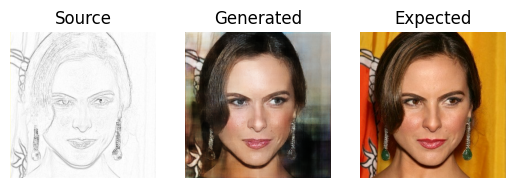

In [ ]:
g_model_last_13K = load_model('/content/drive/MyDrive/AIProject/last_13k_data_generator_model.h5')
predict_from_seen(g_model_last_13K)

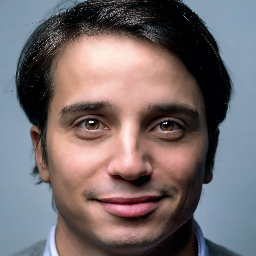

1/1 [==============================] - 0s 24ms/step


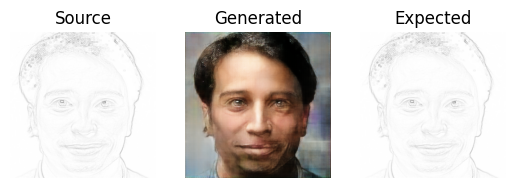

In [ ]:
predict_from_unseen('/content/13.jpg',g_model_last_13K)

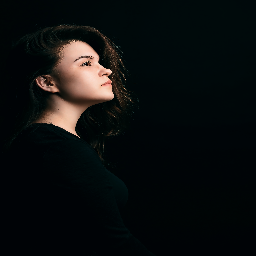

1/1 [==============================] - 0s 29ms/step


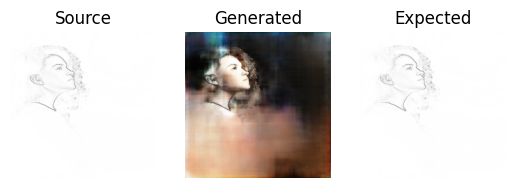

In [ ]:
predict_from_unseen('/content/11.jpg',g_model_last_13K)

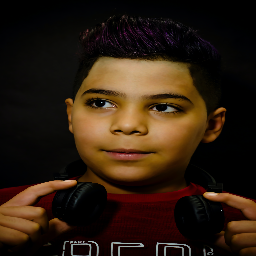

1/1 [==============================] - 0s 23ms/step


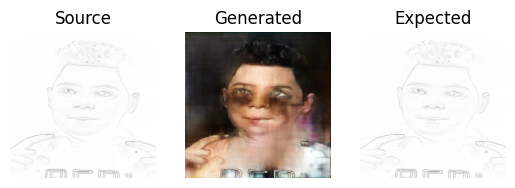

In [ ]:
predict_from_unseen('/content/12.jpg',g_model_last_13K)

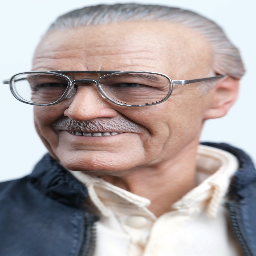

1/1 [==============================] - 0s 28ms/step


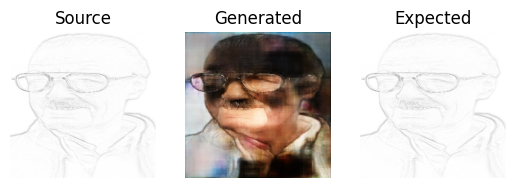

In [ ]:
predict_from_unseen('/content/33.jpg',g_model_last_13K)

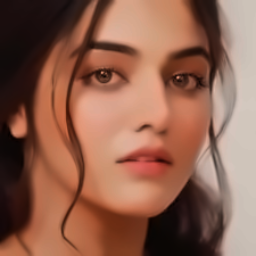

1/1 [==============================] - 0s 30ms/step


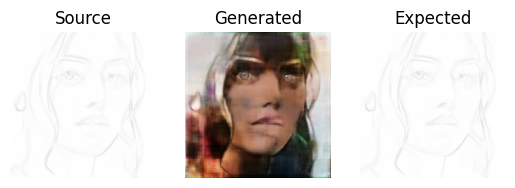

In [ ]:
predict_from_unseen('/content/images.jpg',g_model_last_13K)

#TEST ALL MODEL PREDICTION

##Test 1

8_epoches + 12k data

In [ ]:
model_8 = load_model('/content/drive/MyDrive/AIProject/8_generator_model.h5')

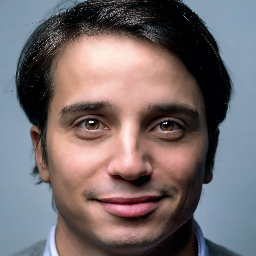

1/1 [==============================] - 1s 664ms/step


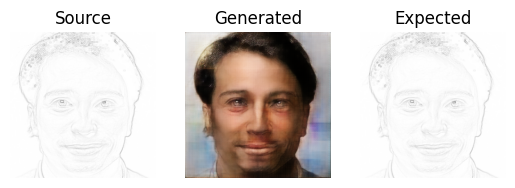

In [ ]:
img_path = '/content/13.jpg'
predict_from_unseen(img_path,model_8)

25 Epoches + 12k data

In [ ]:
model_25 = load_model('/content/drive/MyDrive/AIProject/generator_model_epoch_25.h5')

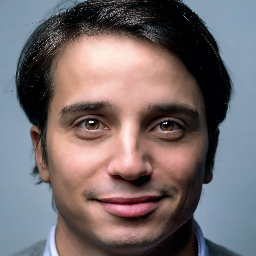

1/1 [==============================] - 0s 354ms/step


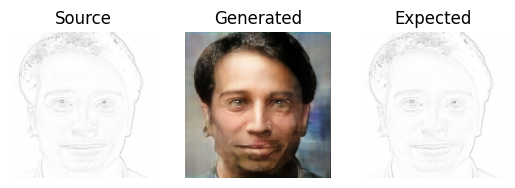

In [ ]:
img_path = '/content/13.jpg'
predict_from_unseen(img_path,model_25)

50_epoches + 12k data

In [ ]:
model_50 = load_model('/content/drive/MyDrive/AIProject/50_generator_model.h5')

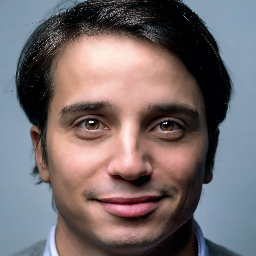

1/1 [==============================] - 0s 342ms/step


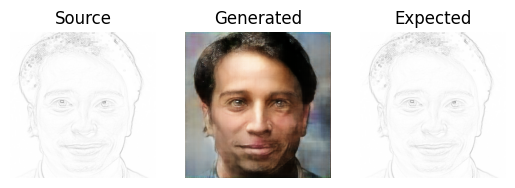

In [ ]:
img_path = '/content/13.jpg'
predict_from_unseen(img_path,model_50)

Finetune further for next 5k data (from 12k to 17k), for 25 epoches

In [ ]:
model_5k = load_model('/content/drive/MyDrive/AIProject/5k_data_generator_model.h5')

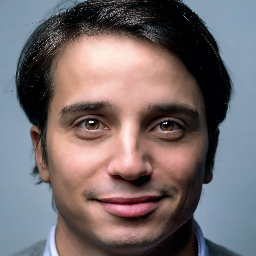

1/1 [==============================] - 0s 22ms/step


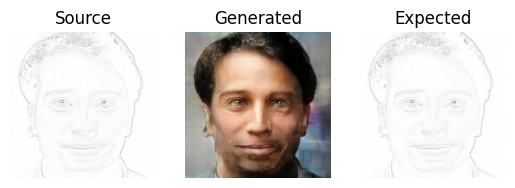

In [ ]:
img_path = '/content/13.jpg'
predict_from_unseen(img_path,model_5k)

Finetune Further model further on last (remaining)13k(from 17k to 30k) images for 25 epoches

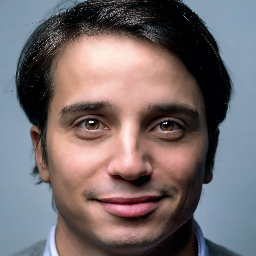

1/1 [==============================] - 0s 27ms/step


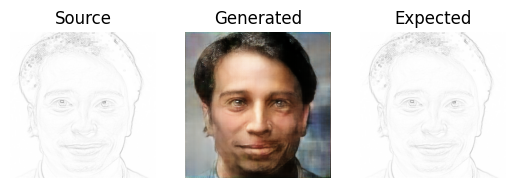

In [ ]:
predict_from_unseen('/content/13.jpg',g_model_last_13K)

##TEST 2

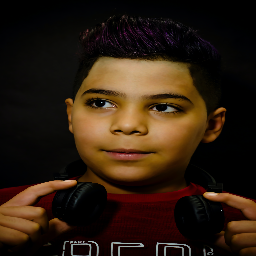

1/1 [==============================] - 0s 463ms/step


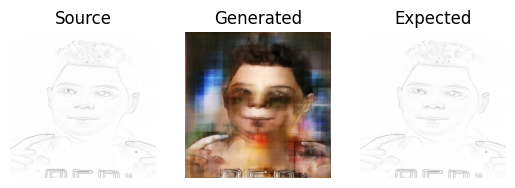

In [ ]:
img_path = '/content/12.jpg'
predict_from_unseen(img_path,model_8)

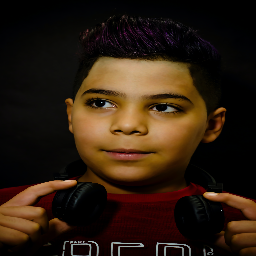

1/1 [==============================] - 0s 326ms/step


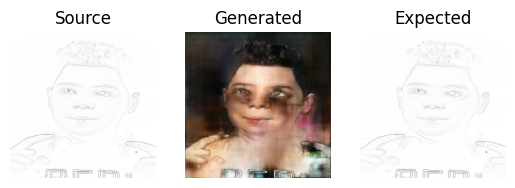

In [ ]:
img_path = '/content/12.jpg'
predict_from_unseen(img_path,model_25)

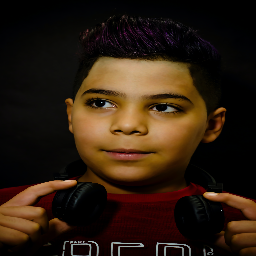

1/1 [==============================] - 0s 426ms/step


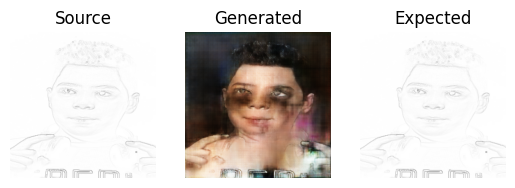

In [ ]:
img_path = '/content/12.jpg'
predict_from_unseen(img_path,model_50)

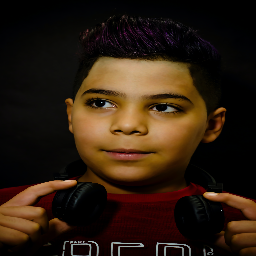

1/1 [==============================] - 0s 22ms/step


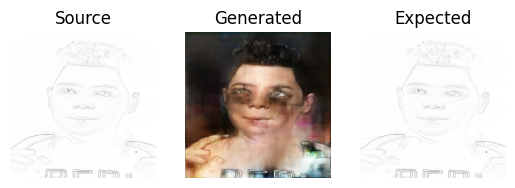

In [ ]:
img_path = '/content/12.jpg'
predict_from_unseen(img_path,model_5k)

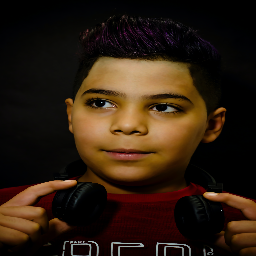

1/1 [==============================] - 0s 28ms/step


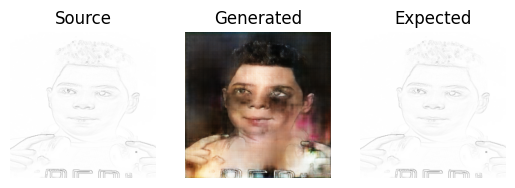

In [ ]:
predict_from_unseen('/content/12.jpg',g_model_last_13K)

##Test 3

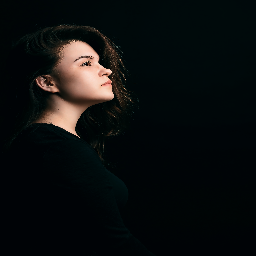

1/1 [==============================] - 0s 335ms/step


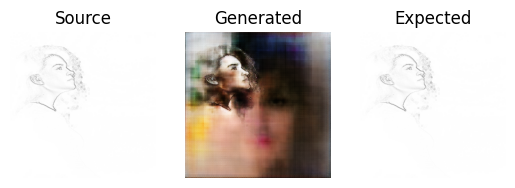

In [ ]:
img_path = '/content/11.jpg'
predict_from_unseen(img_path,model_8)

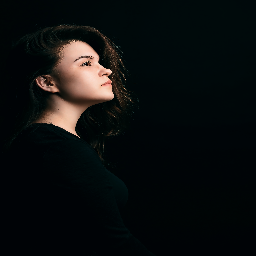

1/1 [==============================] - 0s 329ms/step


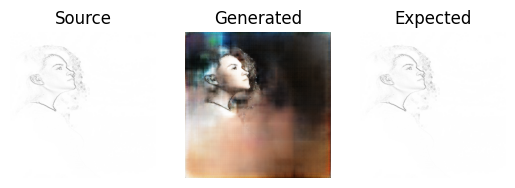

In [ ]:
img_path = '/content/11.jpg'
predict_from_unseen(img_path,model_25)

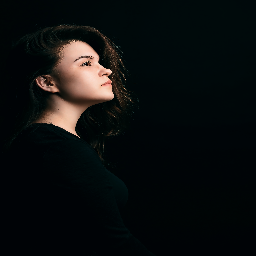

1/1 [==============================] - 0s 369ms/step


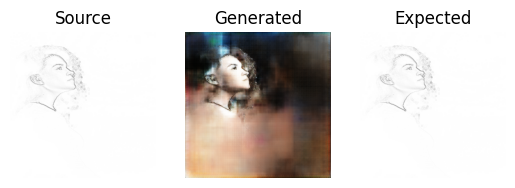

In [ ]:
img_path = '/content/11.jpg'
predict_from_unseen(img_path,model_50)

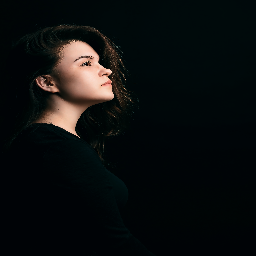

1/1 [==============================] - 0s 22ms/step


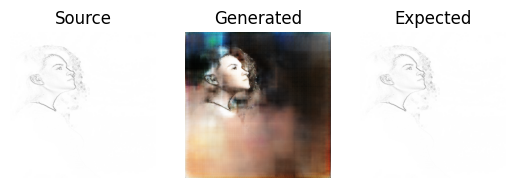

In [ ]:
img_path = '/content/11.jpg'
predict_from_unseen(img_path,model_5k)

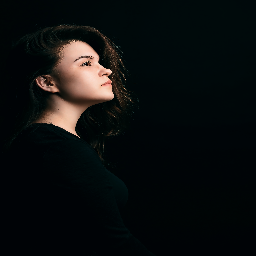

1/1 [==============================] - 0s 29ms/step


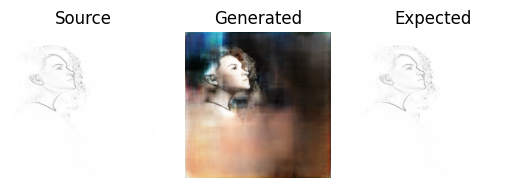

In [ ]:
predict_from_unseen('/content/11.jpg',g_model_last_13K)

##Test 4

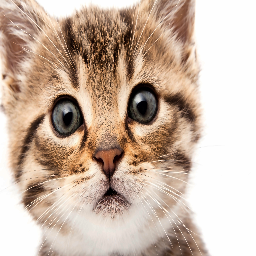

1/1 [==============================] - 1s 616ms/step


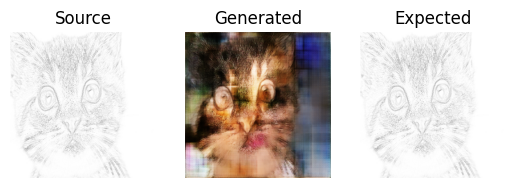

In [ ]:
img_path = '/content/cat.jpg'
predict_from_unseen(img_path,model_8)

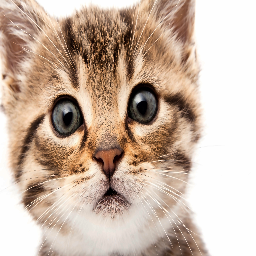

1/1 [==============================] - 0s 349ms/step


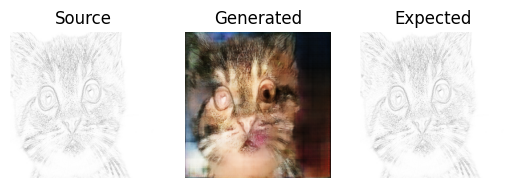

In [ ]:
img_path = '/content/cat.jpg'
predict_from_unseen(img_path,model_25)

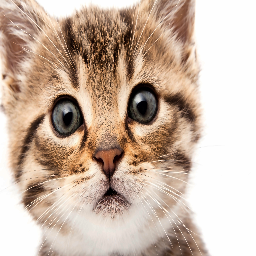

1/1 [==============================] - 0s 331ms/step


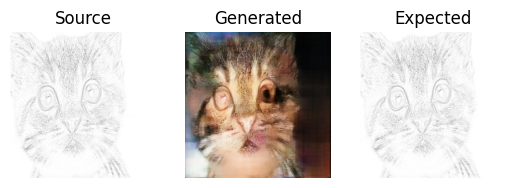

In [ ]:
img_path = '/content/cat.jpg'
predict_from_unseen(img_path,model_50)

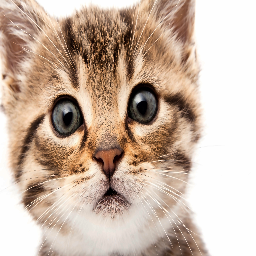

1/1 [==============================] - 0s 23ms/step


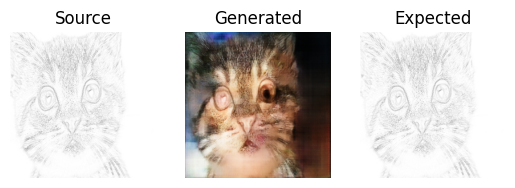

In [ ]:
img_path = '/content/cat.jpg'
predict_from_unseen(img_path,model_5k)

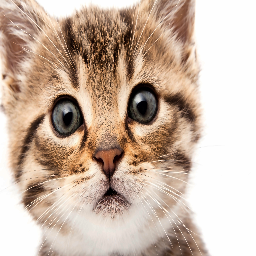

1/1 [==============================] - 0s 26ms/step


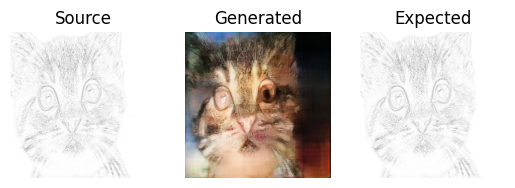

In [ ]:
predict_from_unseen('/content/cat.jpg',g_model_last_13K)

##TEST 5

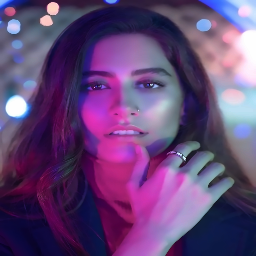

1/1 [==============================] - 0s 459ms/step


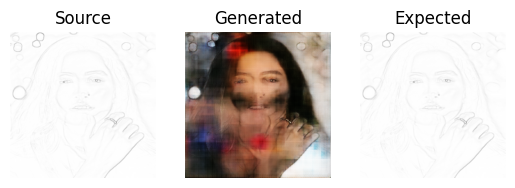

In [ ]:
predict_from_unseen('/content/c.jpg',model_8)

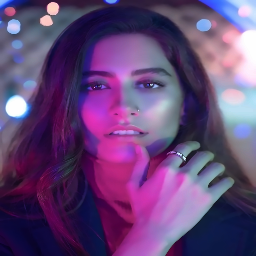

1/1 [==============================] - 0s 442ms/step


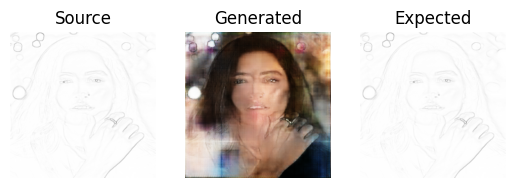

In [ ]:
predict_from_unseen('/content/c.jpg',model_25)

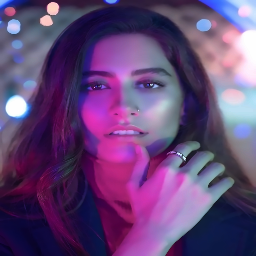

1/1 [==============================] - 0s 432ms/step


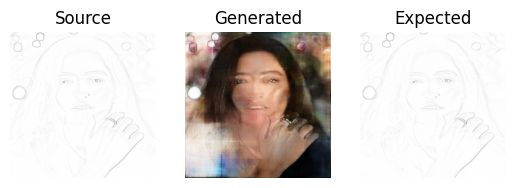

In [ ]:
predict_from_unseen('/content/c.jpg',model_50)

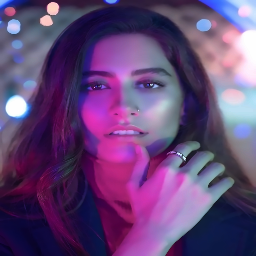

1/1 [==============================] - 0s 417ms/step


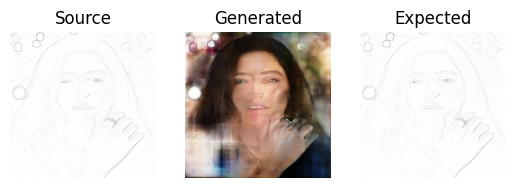

In [ ]:
predict_from_unseen('/content/c.jpg',model_5k)

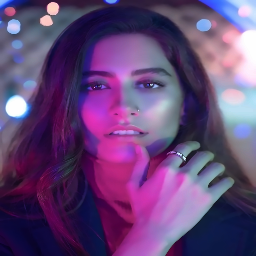

1/1 [==============================] - 0s 28ms/step


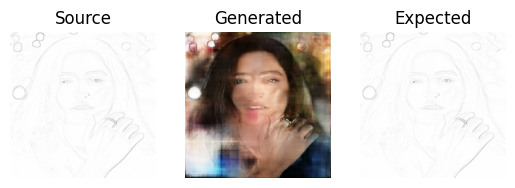

In [ ]:
predict_from_unseen('/content/c.jpg',g_model_last_13K)